<a href="https://colab.research.google.com/github/Sumandhal01/netflix-movies-and-tv-shows-clustering/blob/main/Netflix_Movies_and_TV_shows_clustering.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Project Name    - Netflix Movies and TV Shows Clustering**



##### **Project Type**    - Unsupervised Clustering and Recommendation System
##### **Contribution**    - Individual


# **Project Summary -**

This project aims to analyze the Netflix catalog of movies and TV shows to group them into relevant clusters. This will enhance the user experience and prevent subscriber churn for Netflix.

Dataset:
- Approximately 7787 records and 11 attributes.

Methodology:
1. Handled missing values and performed exploratory data analysis (EDA).
2. Used TFIDF vectorizer to tokenize, preprocess, and vectorize values in specific attributes for clustering.
3. Applied Principal Component Analysis (PCA) to address dimensionality issues.
4. Determined the optimal number of clusters using K-Means Clustering and Agglomerative Hierarchical clustering algorithms.
5. Constructed a content-based recommender system using cosine similarity to provide users with ten recommendations based on their viewing history.

Expected Outcome:
- Improved user experience and reduced subscriber churn for Netflix.
- Identification of new insights and trends in the streaming entertainment industry.

# **GitHub Link -**



https://github.com/Sumandhal01/netflix-movies-and-tv-shows-clustering

# **Problem Statement**


Netflix is a streaming service that offers a wide variety of television shows and movies for viewers to watch at their convenience. With a monthly subscription, users have access to a vast library of content, including original series and films produced by Netflix. The platform also allows users to create multiple profiles, making it easy for family members or roommates to have their own personalized viewing experience. Additionally, Netflix allows users to download content to watch offline, making it a great option for those who travel frequently or have limited internet access. Overall, Netflix is a convenient and cost-effective way to access a wide variety of entertainment.

As of 2022-Q2, more than 220 million people had signed up for Netflix's online streaming service, making it the largest OTT provider worldwide. To improve the user experience and prevent subscriber churn, they must efficiently cluster the shows hosted on their platform.

By creating clusters, we will be able to comprehend the shows that are alike and different from one another. These clusters can be used to provide customers with individualized show recommendations based on their preferences.

This project aims to classify and group Netflix shows into specific clusters in such a way that shows in the same cluster are similar to one another and shows in different clusters are different.

# **General Guidelines** : -  

1.   Well-structured, formatted, and commented code is required.
2.   Exception Handling, Production Grade Code & Deployment Ready Code will be a plus. Those students will be awarded some additional credits.
     
     The additional credits will have advantages over other students during Star Student selection.
       
             [ Note: - Deployment Ready Code is defined as, the whole .ipynb notebook should be executable in one go
                       without a single error logged. ]

3.   Each and every logic should have proper comments.
4. You may add as many number of charts you want. Make Sure for each and every chart the following format should be answered.
        

```
# Chart visualization code
```
            

*   Why did you pick the specific chart?
*   What is/are the insight(s) found from the chart?
* Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

5. You have to create at least 15 logical & meaningful charts having important insights.


[ Hints : - Do the Vizualization in  a structured way while following "UBM" Rule.

U - Univariate Analysis,

B - Bivariate Analysis (Numerical - Categorical, Numerical - Numerical, Categorical - Categorical)

M - Multivariate Analysis
 ]





6. You may add more ml algorithms for model creation. Make sure for each and every algorithm, the following format should be answered.


*   Explain the ML Model used and it's performance using Evaluation metric Score Chart.


*   Cross- Validation & Hyperparameter Tuning

*   Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

*   Explain each evaluation metric's indication towards business and the business impact pf the ML model used.




















# ***Let's Begin!***

## ***1. Know your Data***

### **Importing required libraries**

In [ ]:
# Import Libraries and modules

# libraries that are used for analysis and visualization
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

# Word Cloud library
from wordcloud import WordCloud, STOPWORDS

# libraries used to process textual data
import string
string.punctuation
import nltk
from nltk.corpus import stopwords
nltk.download('stopwords')
from nltk.stem.snowball import SnowballStemmer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import PCA

# libraries used to implement clusters
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.cluster import AgglomerativeClustering
import scipy.cluster.hierarchy as shc

# libraries that are used to construct a recommendation system
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity

# Library of warnings would assist in ignoring warnings issued
import warnings
warnings.filterwarnings('ignore')

# library for performing hypothetical testing
!pip install scipy
import scipy.stats as stats
from scipy.stats import pearsonr


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


### **Loading Dataset**

In [ ]:
# load the NETFLIX MOVIES AND TV SHOWS CLUSTERING data set from the drive
netflixdf = pd.read_csv('https://drive.google.com/uc?export=download&id=1uCzKRPPE7bSELDZ19com-yXubvp15mfp')

### **Dataset First View**

In [ ]:
# Check the dataset
netflixdf

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
0,s1,TV Show,3%,NaN,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,"August 14, 2020",2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,"December 23, 2016",2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,"December 20, 2018",2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow..."
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,"November 16, 2017",2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi..."
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,"January 1, 2020",2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...
...,...,...,...,...,...,...,...,...,...,...,...,...
7782,s7783,Movie,Zozo,Josef Fares,"Imad Creidi, Antoinette Turk, Elias Gergi, Car...","Sweden, Czech Republic, United Kingdom, Denmar...","October 19, 2020",2005,TV-MA,99 min,"Dramas, International Movies",When Lebanon's Civil War deprives Zozo of his ...
7783,s7784,Movie,Zubaan,Mozez Singh,"Vicky Kaushal, Sarah-Jane Dias, Raaghav Chanan...",India,"March 2, 2019",2015,TV-14,111 min,"Dramas, International Movies, Music & Musicals",A scrappy but poor boy worms his way into a ty...
7784,s7785,Movie,Zulu Man in Japan,NaN,Nasty C,NaN,"September 25, 2020",2019,TV-MA,44 min,"Documentaries, International Movies, Music & M...","In this documentary, South African rapper Nast..."
7785,s7786,TV Show,Zumbo's Just Desserts,NaN,"Adriano Zumbo, Rachel Khoo",Australia,"October 31, 2020",2019,TV-PG,1 Season,"International TV Shows, Reality TV",Dessert wizard Adriano Zumbo looks for the nex...


In [ ]:
# top 6 rows
netflixdf.head(6)

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
0,s1,TV Show,3%,NaN,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,"August 14, 2020",2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,"December 23, 2016",2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,"December 20, 2018",2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow..."
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,"November 16, 2017",2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi..."
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,"January 1, 2020",2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...
5,s6,TV Show,46,Serdar Akar,"Erdal Beşikçioğlu, Yasemin Allen, Melis Birkan...",Turkey,"July 1, 2017",2016,TV-MA,1 Season,"International TV Shows, TV Dramas, TV Mysteries",A genetics professor experiments with a treatm...


In [ ]:
# last 6 rows
netflixdf.tail(6)

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
7781,s7782,Movie,Zoom,Peter Hewitt,"Tim Allen, Courteney Cox, Chevy Chase, Kate Ma...",United States,"January 11, 2020",2006,PG,88 min,"Children & Family Movies, Comedies","Dragged from civilian life, a former superhero..."
7782,s7783,Movie,Zozo,Josef Fares,"Imad Creidi, Antoinette Turk, Elias Gergi, Car...","Sweden, Czech Republic, United Kingdom, Denmar...","October 19, 2020",2005,TV-MA,99 min,"Dramas, International Movies",When Lebanon's Civil War deprives Zozo of his ...
7783,s7784,Movie,Zubaan,Mozez Singh,"Vicky Kaushal, Sarah-Jane Dias, Raaghav Chanan...",India,"March 2, 2019",2015,TV-14,111 min,"Dramas, International Movies, Music & Musicals",A scrappy but poor boy worms his way into a ty...
7784,s7785,Movie,Zulu Man in Japan,NaN,Nasty C,NaN,"September 25, 2020",2019,TV-MA,44 min,"Documentaries, International Movies, Music & M...","In this documentary, South African rapper Nast..."
7785,s7786,TV Show,Zumbo's Just Desserts,NaN,"Adriano Zumbo, Rachel Khoo",Australia,"October 31, 2020",2019,TV-PG,1 Season,"International TV Shows, Reality TV",Dessert wizard Adriano Zumbo looks for the nex...
7786,s7787,Movie,ZZ TOP: THAT LITTLE OL' BAND FROM TEXAS,Sam Dunn,NaN,"United Kingdom, Canada, United States","March 1, 2020",2019,TV-MA,90 min,"Documentaries, Music & Musicals",This documentary delves into the mystique behi...


### **Dataset Rows and Columns count**


In [ ]:
# Dataset Rows & Columns
netflixdf.shape

(7787, 12)

In [ ]:
# list of columns
netflixdf.columns

Index(['show_id', 'type', 'title', 'director', 'cast', 'country', 'date_added',
       'release_year', 'rating', 'duration', 'listed_in', 'description'],
      dtype='object')

### **Dataset Information**

In [ ]:
# Dataset Info
netflixdf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7787 entries, 0 to 7786
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   show_id       7787 non-null   object
 1   type          7787 non-null   object
 2   title         7787 non-null   object
 3   director      5398 non-null   object
 4   cast          7069 non-null   object
 5   country       7280 non-null   object
 6   date_added    7777 non-null   object
 7   release_year  7787 non-null   int64 
 8   rating        7780 non-null   object
 9   duration      7787 non-null   object
 10  listed_in     7787 non-null   object
 11  description   7787 non-null   object
dtypes: int64(1), object(11)
memory usage: 730.2+ KB


#### Duplicate values

In [ ]:
# Duplicate Value Count
netflixdf.duplicated()

0       False
1       False
2       False
3       False
4       False
        ...  
7782    False
7783    False
7784    False
7785    False
7786    False
Length: 7787, dtype: bool

In [ ]:
# Duplicate Value Count
netflixdf[netflixdf.duplicated()].shape

(0, 12)

We found that there were no duplicate entries in the above data.

#### Missing Values/Null Values

In [ ]:
# Missing/Null values
netflixdf.isna()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
0,False,False,False,True,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...
7782,False,False,False,False,False,False,False,False,False,False,False,False
7783,False,False,False,False,False,False,False,False,False,False,False,False
7784,False,False,False,True,False,True,False,False,False,False,False,False
7785,False,False,False,True,False,False,False,False,False,False,False,False


In [ ]:
# Missing/Null values count
netflixdf.isnull().sum().sort_values(ascending=False)[:8]


director      2389
cast           718
country        507
date_added      10
rating           7
show_id          0
type             0
title            0
dtype: int64

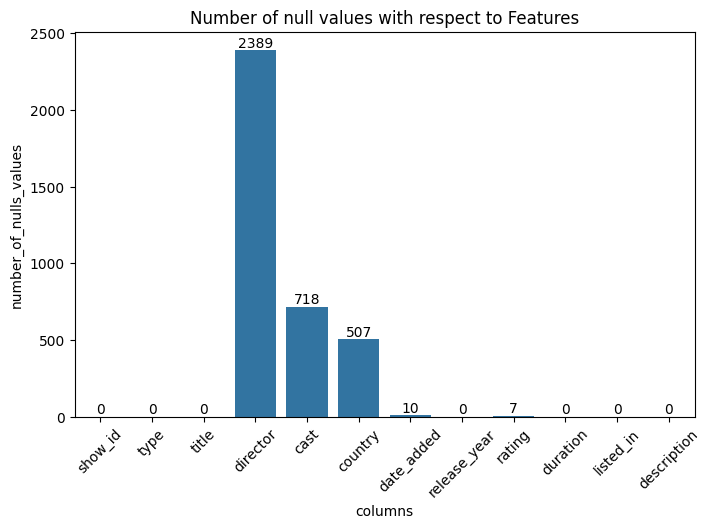

In [ ]:
# Ploting number of null values with its variable
null_df=pd.DataFrame({'columns':netflixdf.columns,'number_of_nulls_values':netflixdf.isna().sum()})
null_df.set_index('columns').sort_values(by='number_of_nulls_values', ascending = False)
plt.figure(figsize=(8,5))
ax=sns.barplot(x='columns', y='number_of_nulls_values', data=null_df)
ax.bar_label(ax.containers[0])
plt.title('Number of null values with respect to Features')
plt.xticks(rotation= 45)
plt.show()

In [ ]:
# create a copy of the dataset
netflix = netflixdf.copy()

### What did you know about your dataset?

The given dataset is from the online streaming industry; our task is to examine the dataset, build the clustering methods and content based recommendation system.

Clustering is a technique used in machine learning and data mining to group similar data points together. A clustering algorithm is a method or technique used to identify clusters within a dataset. These clusters represent natural groupings of the data, and the goal of clustering is to discover these groupings without any prior knowledge of the groupings.

* There are 7787 rows and 12 columns in the dataset. In the director, cast, country, date_added, and rating columns, there are missing values. The dataset does not contain any duplicate values.

* Every row of information we have relates to a specific movie. Therefore, we are unable to use any method to impute any null values. Additionally, due to the small size of the data, we do not want to lose any data, so after analyzing each column, we simply impute numeric values using an empty string in the following procedure.

## ***2. Understanding Your Variables***

In [ ]:
# Dataset Columns
netflix.columns

Index(['show_id', 'type', 'title', 'director', 'cast', 'country', 'date_added',
       'release_year', 'rating', 'duration', 'listed_in', 'description'],
      dtype='object')

In [ ]:
# Dataset Describe    (used to get statistics of numerical columns)
netflix.describe()

,release_year
count,7787.000000
mean,2013.932580
std,8.757395
min,1925.000000
25%,2013.000000
50%,2017.000000
75%,2018.000000
max,2021.000000


###  Variables Description

* **show_id :** Unique ID for every Movie/Show
* **type :** Identifier - Movie/Show
* **title :** Title of the Movie/Show
* **director :** Director of the Movie/Show
* **cast :** Actors involved in the Movie/Show
* **country :** Country where the Movie/Show was produced
* **date_added :** Date it was added on Netflix
* **release_year :** Actual Release year of the Movie/Show
* **rating :** TV Rating of the Movie/Show
* **duration :** Total Duration - in minutes or number of seasons
* **listed_in :** Genre
* **description :** The Summary description

### Unique Values

In [ ]:
# Check Unique Values for each variable.
for i in netflix.columns.tolist():
  print("No. of unique values in",i,"is",netflix[i].nunique())

No. of unique values in show_id is 7787
No. of unique values in type is 2
No. of unique values in title is 7787
No. of unique values in director is 4049
No. of unique values in cast is 6831
No. of unique values in country is 681
No. of unique values in date_added is 1565
No. of unique values in release_year is 73
No. of unique values in rating is 14
No. of unique values in duration is 216
No. of unique values in listed_in is 492
No. of unique values in description is 7769


In [ ]:
netflix['type'].unique()

array(['TV Show', 'Movie'], dtype=object)

In [ ]:
netflix['rating'].unique()

array(['TV-MA', 'R', 'PG-13', 'TV-14', 'TV-PG', 'NR', 'TV-G', 'TV-Y', nan,
       'TV-Y7', 'PG', 'G', 'NC-17', 'TV-Y7-FV', 'UR'], dtype=object)

## ***3. Data Wrangling***

### Data Wrangling Code

Handling Missing Data

In [ ]:
# Missing/Null values count
netflix.isnull().sum().sort_values(ascending=False)[:8]

director      2389
cast           718
country        507
date_added      10
rating           7
show_id          0
type             0
title            0
dtype: int64

In [ ]:
# Filling null values of features director, cast and country
netflix[['director','cast','country']] = netflix[['director','cast','country']].fillna(' ')
# Dropping null values from date_added and rating columns
netflix.dropna(axis=0, inplace=True)

In [ ]:
# Missing/Null values count
netflix.isnull().sum().sort_values(ascending=False)[:8]

show_id         0
type            0
title           0
director        0
cast            0
country         0
date_added      0
release_year    0
dtype: int64

type casting the columns to appropriate datatypes and arranging column

In [ ]:
netflix['date_added'].head(10)

0      August 14, 2020
1    December 23, 2016
2    December 20, 2018
3    November 16, 2017
4      January 1, 2020
5         July 1, 2017
6         June 1, 2020
7     November 1, 2019
8        April 1, 2019
9    December 15, 2017
Name: date_added, dtype: object

In [ ]:
# change date_added from object datatype to Date datatype
netflix['date_added'] = pd.to_datetime(netflix['date_added'],format='mixed')
netflix['date_added']

# Converting the data type of release_year to the appropriate data type
netflix.release_year = netflix.release_year.astype('int64')
netflix['release_year']

0       2020
1       2016
2       2011
3       2009
4       2008
        ... 
7782    2005
7783    2015
7784    2019
7785    2019
7786    2019
Name: release_year, Length: 7770, dtype: int64

In [ ]:
## Adding new features based on feature date_added
netflix['year']=netflix['date_added'].dt.year
netflix['month']=netflix['date_added'].dt.month
netflix['day_added']=netflix['date_added'].dt.day

# Delete feature date_added
netflix=netflix.drop('date_added', axis='columns')
netflix.head()

,show_id,type,title,director,cast,country,release_year,rating,duration,listed_in,description,year,month,day_added
0,s1,TV Show,3%,,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...,2020,8,14
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...,2016,12,23
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow...",2018,12,20
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi...",2017,11,16
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...,2020,1,1


In [ ]:
netflix.day_added = netflix.day_added.astype('int64')

changeing column names for better understanding

In [ ]:
# changing name of variable listed_in to genre
netflix.rename = netflix.rename(columns={'listed_in':'genres'}, inplace=True)

In [ ]:
netflix.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7770 entries, 0 to 7786
Data columns (total 14 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   show_id       7770 non-null   object
 1   type          7770 non-null   object
 2   title         7770 non-null   object
 3   director      7770 non-null   object
 4   cast          7770 non-null   object
 5   country       7770 non-null   object
 6   release_year  7770 non-null   int64 
 7   rating        7770 non-null   object
 8   duration      7770 non-null   object
 9   genres        7770 non-null   object
 10  description   7770 non-null   object
 11  year          7770 non-null   int32 
 12  month         7770 non-null   int32 
 13  day_added     7770 non-null   int64 
dtypes: int32(2), int64(2), object(10)
memory usage: 849.8+ KB


Handling Outliers

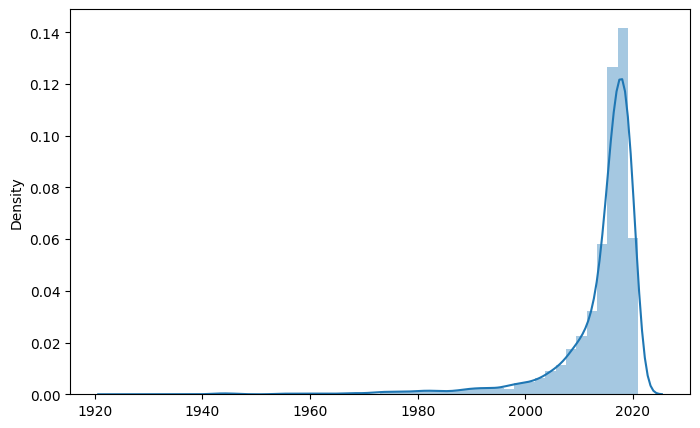

In [ ]:
# plotting graph for outliers
plt.figure(figsize=(8,5))
sns.distplot(x=netflix['release_year'])
plt.show()

In [ ]:
# Using Inter Quartile range in skew symmetric curve for removing outliers
cat_var=[var for var in netflix.describe(include='object')]
num=[var for var in netflix.columns if var not in cat_var]
# Capping dataset
for i in num:
    # Findling IQR
    Q1=netflix[i].quantile(0.25)
    Q3=netflix[i].quantile(0.75)
    IQR=Q3-Q1

    # Defining upper and lower limit
    lower_limit =netflix[i].quantile(0.25)-1.5*IQR
    upper_limit =netflix[i].quantile(0.75)+1.5*IQR

    # Applying lower and upper limit to each variables
    netflix.loc[(netflix[i] > upper_limit),i] = upper_limit
    netflix.loc[(netflix[i] < lower_limit),i] = lower_limit

### What all manipulations have been done and insights found?

*   Find the duplicate values.
*   As there are no duplicate values so it is not required to be handled.
*   Find all the missing values in the dataset. Four columns have missing values that are director,cast,country,date_added .

*   Convert some columns to appropriate datatypes. Convert the datatype of column date_added and release_year.
* date_added is from object to datetime and release_year is from float64 to int64.
*   Rename some column for better understanding.




## ***4. Data Vizualization, Storytelling & Experimenting with charts : Understand the relationships between variables***

#### **Chart 1**

In [ ]:
# number of values of different categories in 'type'
netflix['type'].value_counts()

type
Movie      5372
TV Show    2398
Name: count, dtype: int64

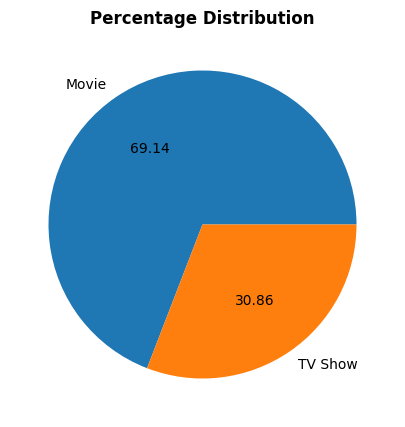

In [ ]:
# plot piechart for the percentage distribution
plt.figure(figsize = (8,5))
type_of_content =netflix.groupby(by='type').size()
plt.pie(type_of_content,labels=['Movie','TV Show'],autopct='%.2f')
plt.title('Percentage Distribution', weight="bold")
plt.show()

 Movies has more number of counts than TV Shows that is 31% of the data are from TV shows, while 69% of the data are from movies.

##### 1. Why did you pick the specific chart?




*   Pie charts are used to display the relative proportions of different categories within a dataset.
*   In this case, we used a pie chart to show the percentage distribution of movies and TV shows in the Netflix dataset.
*   Pie charts are effective for showing the relative sizes of different categories and for making comparisons between categories.







##### 2. What is/are the insight(s) found from the chart?



*   The chart shows that movies make up the majority of the content on Netflix, with TV shows accounting for a smaller proportion.
*   This information could be used to inform decisions about what type of content to produce or acquire in the future.
*   For example, Netflix could decide to focus on producing more movies, since they are more popular with users.



##### 3. Will the gained insights help creating a positive business impact?

Are there any insights that lead to negative growth? Justify with specific reason.

Yes, the gained insights can help create a positive business impact.

* By understanding the types of content that users prefer, Netflix can create more content that is likely to be popular with users. This can lead to increased user engagement and retention.
* Netflix can use the insights gained from the data to improve its content recommendations. This can help users find the content they want to watch more quickly and easily, which can also lead to increased user engagement.
* Netflix can use the insights gained from the data to target its marketing efforts more effectively. For example, Netflix could target users who have watched a lot of movies with a new movie trailer. This can help Netflix reach more potential customers and increase its subscriber base.

Overall, the insights gained from the data can help Netflix create a more personalized and engaging experience for its users. This can lead to increased user engagement, retention, and subscriber growth.

There are some potential risk which may lead to negative growth:

*   The pie chart shows that movies make up the majority of the content on Netflix, with TV shows accounting for a smaller proportion. This insight could lead to negative growth if Netflix focuses too heavily on producing movies and neglects TV shows. TV shows are becoming increasingly popular, and Netflix could lose market share to competitors if it does not offer a strong selection of TV shows
*   The pie chart does not provide any information about the quality of the movies and TV shows on Netflix. It is possible that the movies on Netflix are of higher quality than the TV shows, which could lead to a negative impact on growth if users are not satisfied with the quality of the TV shows.




#### **Chart 2**

In [ ]:
netflix.director.nunique()

4048

In [ ]:
# num of movies directed by director
print(netflix[netflix['type']=='TV Show']['director'].value_counts().sum())

# Numb of TV shows directed by directors
print(netflix[netflix['type']=='Movie']['director'].value_counts().sum())


2398
5372


In [ ]:
# creating two different dataframes for tv_shows and movies

# tv_shows
tv_shows_df= pd.DataFrame(netflix[netflix['type']=='TV Show'])

# movies
movies_df= pd.DataFrame(netflix[netflix['type']=='Movie'])

In [ ]:
print(tv_shows_df['director'].value_counts().head(10))

director
                              2214
Alastair Fothergill              3
Shin Won-ho                      2
Iginio Straffi                   2
Rob Seidenglanz                  2
Stan Lathan                      2
Ken Burns                        2
Cosima Spender                   1
Jani Lachauer, Jakob Schuh       1
Jalil Lespert                    1
Name: count, dtype: int64


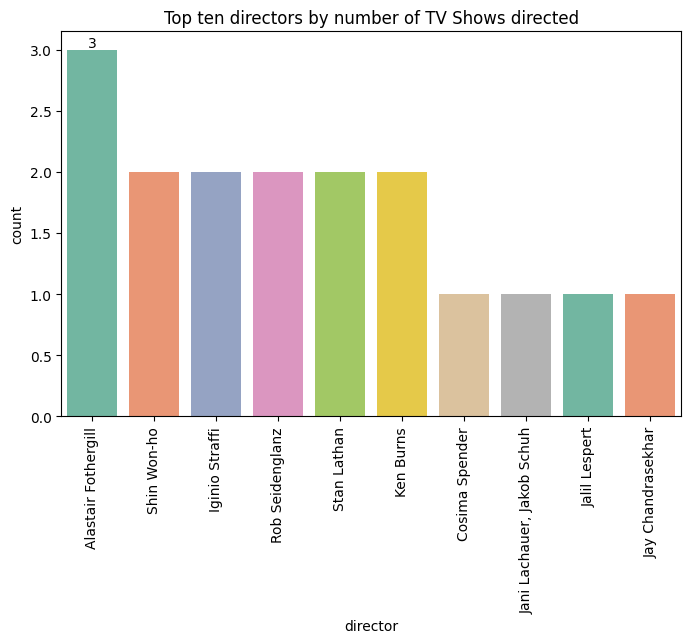

In [ ]:
## The directors of the majority of TV Shows

# Removing observations where the director is unavailable
tv_shows_df=tv_shows_df[tv_shows_df['director'] != 'Director Unavailable']

# Plotting count plot graph for top most 10 directors of TV Shows
plt.figure(figsize=(8,5))
ax=sns.countplot(x=tv_shows_df['director'], order=tv_shows_df.director.value_counts().index[1:11],palette='Set2')
ax.bar_label(ax.containers[0])
plt.xticks(rotation=90)
plt.title('Top ten directors by number of TV Shows directed')
plt.show()

The three shows directed by Alastair Fothergill are the highest on the data list.

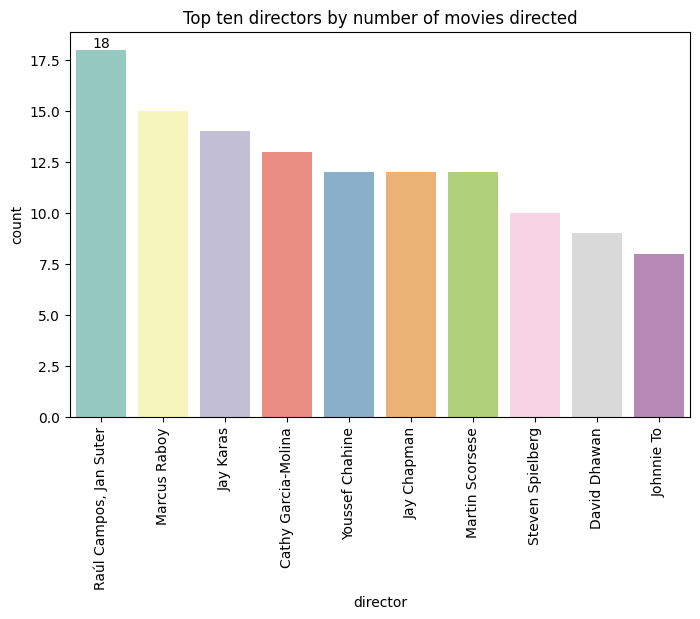

In [ ]:
## The directors of the majority of movies

# Removing observations where the director is unavailable
movies_df=movies_df[movies_df['director'] != 'Director Unavailable']


# Plotting count plot graph for top most 10 directors of movies
plt.figure(figsize=(8,5))
ax=sns.countplot(x=movies_df['director'], order=movies_df.director.value_counts().index[1:11], palette='Set3')
ax.bar_label(ax.containers[0])
plt.xticks(rotation=90)
plt.title('Top ten directors by number of movies directed')
plt.show()

Both, Jan Suter and Raul Campos have directed 18 films, more than anyone else in the dataset.

##### 1. Why did you pick the specific chart?



*   The count plot is used to show the number of observations for each category in a categorical variable.
*   In this case, we used a count plot to show the number of movies and TV shows directed by each director.
*   Count plots are effective for showing the frequency of different categories and for comparing the frequency of different categories.






##### 2. What is/are the insight(s) found from the chart?

*   The chart shows that there are a small number of directors who have directed a large number of movies and TV shows.
*   For example, Alastair Fothergill has directed three TV shows, and Jan Suter and Raul Campos have directed 18 movies each.
*   This information could be used to identify potential directors for future projects.
*   For example, Netflix could reach out to Alastair Fothergill to see if he is interested in directing a new TV show.
*   The chart also shows that there are a large number of directors who have directed only a small number of movies and TV shows.
*   This information could be used to identify potential new directors.
*   For example, Netflix could reach out to some of the directors who have directed only one or two movies or TV shows to see if they are interested in directing a new project.


##### 3. Will the gained insights help creating a positive business impact?

Are there any insights that lead to negative growth? Justify with specific reason.

Yes, the gained insights can help create a positive business impact.

* By understanding which directors are the most popular with users, Netflix can make informed decisions about who to hire to direct new projects. This can help Netflix create content that is more likely to be popular with users, which can lead to increased user engagement and retention.
* Netflix can also use the insights gained from the data to identify potential new directors. This can help Netflix find new talent and create a more diverse range of content.
* Overall, the insights gained from the data can help Netflix create a more personalized and engaging experience for its users. This can lead to increased user engagement, retention, and subscriber growth.

There are some potential risks associated with using the data to identify directors for new projects.

* One risk is that Netflix may become too reliant on a small number of popular directors. This could lead to a lack of diversity in the content that Netflix produces.
* Another risk is that Netflix may not be able to find new directors who are as talented as the directors who are already working with Netflix. This could lead to a decline in the quality of the content that Netflix produces.

Overall, the benefits of using the data to identify directors for new projects outweigh the risks. By carefully considering the insights gained from the data, Netflix can make informed decisions about who to hire to direct new projects. This can help Netflix create content that is more likely to be popular with users, which can lead to increased user engagement and retention.

#### **Chart 3**

In [ ]:
# number of unique values
netflix['title'].nunique()

7770

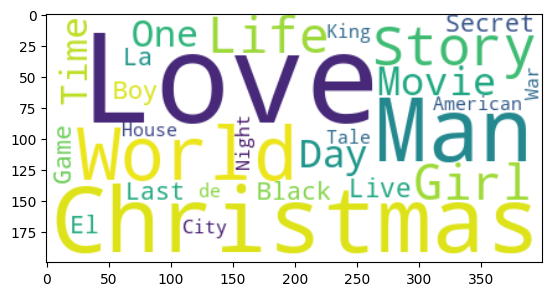

In [ ]:
# text documents
text = " ".join(word for word in netflix['title'])

# create the word cloud using WordCloud library
wordcloud = WordCloud(stopwords=STOPWORDS, background_color='white', min_font_size=15).generate(text)

# plot the word cloud
plt.imshow(wordcloud,  interpolation='bilinear')
plt.show()

 Words like 'Love', 'Christmas', 'Man', 'World', 'Life', 'Girl', and 'Story' are frequently used in the movie title column.

##### 1. Why did you pick the specific chart?

*   The word cloud is a type of chart that is used to visualize the frequency of words in a text document.
*   We used a word cloud to visualize the frequency of words in the movie title column of the Netflix dataset.
*   Word clouds are effective for identifying the most common words in a text document and for understanding the overall themes and topics of the document.


##### 2. What is/are the insight(s) found from the chart?


*   The word cloud shows that the most common words in the movie title column are "Love", "Christmas", "Man", "World", "Life", "Girl", and "Story".
*   This information could be used to identify potential genres for new movies or TV shows.
*   For example, Netflix could use the insights gained from the word cloud to create a new movie or TV show about love or Christmas.
*   The word cloud also shows that there are a number of words that are related to violence and crime, such as "Murder", "Killer", and "Dead".
*   This information could be used to identify potential target audiences for new movies or TV shows.
*   For example, Netflix could use the insights gained from the word cloud to create a new movie or TV show that is targeted at fans of violence and crime.

##### 3. Will the gained insights help creating a positive business impact?

Are there any insights that lead to negative growth? Justify with specific reason.

Yes, the gained insights can help create a positive business impact.

* By understanding the most common words in the movie title column, Netflix can identify potential genres for new movies or TV shows. This can help Netflix create content that is more likely to be popular with users, which can lead to increased user engagement and retention.
* Netflix can also use the insights gained from the data to identify potential target audiences for new movies or TV shows. This can help Netflix reach a wider audience and increase its subscriber base.
* Overall, the insights gained from the data can help Netflix create a more personalized and engaging experience for its users. This can lead to increased user engagement, retention, and subscriber growth.

There are some potential risks associated with using the data to identify genres and target audiences for new movies or TV shows.

* One risk is that Netflix may become too reliant on a small number of popular genres or target audiences. This could lead to a lack of diversity in the content that Netflix produces.
* Another risk is that Netflix may not be able to find new genres or target audiences that are as successful as the genres or target audiences that Netflix is already focusing on. This could lead to a decline in the quality of the content that Netflix produces.

Overall, the benefits of using the data to identify genres and target audiences for new movies or TV shows outweigh the risks. By carefully considering the insights gained from the data, Netflix can make informed decisions about what type of content to produce and who to target with its marketing efforts. This can help Netflix create content that is more likely to be popular with users, which can lead to increased user engagement, retention, and subscriber growth.

#### **Chart 4**

In [ ]:
netflix['cast']

0       João Miguel, Bianca Comparato, Michel Gomes, R...
1       Demián Bichir, Héctor Bonilla, Oscar Serrano, ...
2       Tedd Chan, Stella Chung, Henley Hii, Lawrence ...
3       Elijah Wood, John C. Reilly, Jennifer Connelly...
4       Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...
                              ...                        
7782    Imad Creidi, Antoinette Turk, Elias Gergi, Car...
7783    Vicky Kaushal, Sarah-Jane Dias, Raaghav Chanan...
7784                                              Nasty C
7785                           Adriano Zumbo, Rachel Khoo
7786                                                     
Name: cast, Length: 7770, dtype: object

In [ ]:
# seperating actors from cast column
cast = netflix['cast'].str.split(', ', expand=True).stack()

# top actors name who play highest role in movie/show.
cast.value_counts()

                    718
Anupam Kher          42
Shah Rukh Khan       35
Naseeruddin Shah     30
Om Puri              30
                   ... 
Mylene Dizon          1
Lorenz Martinez       1
Art Acuña             1
Archie Alemania       1
Rachel Khoo           1
Name: count, Length: 32837, dtype: int64

In [ ]:
# tv shows actors
netflix[netflix['type']=='TV Show']['cast'].str.split(', ',expand=True).stack().value_counts()

                    292
Takahiro Sakurai     22
Yuki Kaji            17
Daisuke Ono          16
Ai Kayano            15
                   ... 
Phil Burke            1
Robin McLeavy         1
Tom Noonan            1
Lukas Engel           1
Rachel Khoo           1
Name: count, Length: 13526, dtype: int64

In [ ]:
# Movie actors
netflix[netflix['type']=='Movie']['cast'].str.split(', ',expand=True).stack().value_counts()

                    426
Anupam Kher          41
Shah Rukh Khan       35
Om Puri              30
Naseeruddin Shah     30
                   ... 
Chester Rushing       1
Anthony Lister        1
Belle Shouse          1
Douglas Tait          1
Nasty C               1
Name: count, Length: 23043, dtype: int64

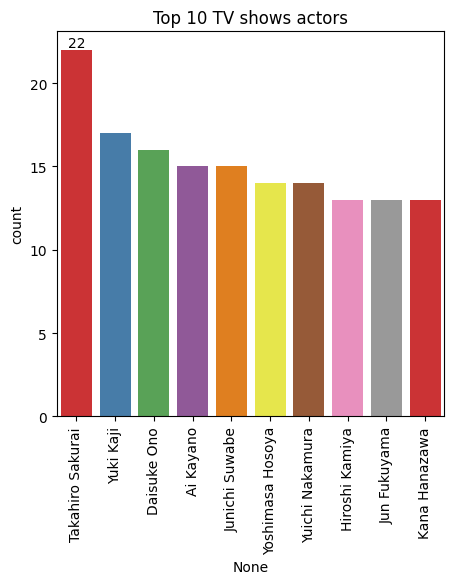

In [ ]:
# seperating TV shows actor from cast column
top_TVshows_actor = netflix[netflix['type']=='TV Show']['cast'].str.split(', ', expand=True).stack()

# Defining size of plot
plt.figure(figsize=(5,5))

# Plotting count plot graph for top most 10 directors of movies
ax=sns.countplot(x=top_TVshows_actor, order=top_TVshows_actor.value_counts().index[1:11], palette='Set1')

# Assigning labels to the graph
ax.bar_label(ax.containers[0])
plt.xticks(rotation=90)
plt.title('Top 10 TV shows actors')

# Displaying plot
plt.show()

 In the shows, Takahiro Sakurai, Yuki Kaji, and Daisuke Ono played the most number of roles.

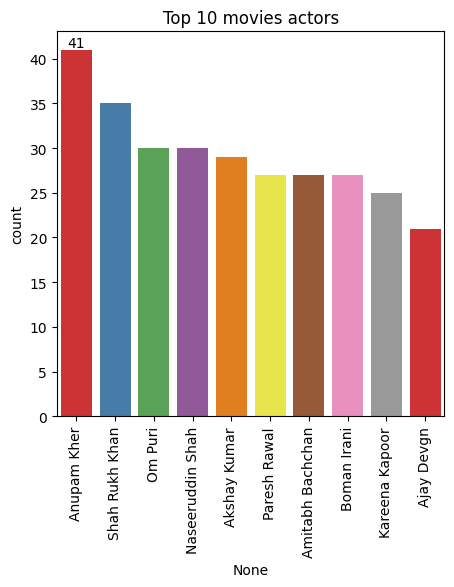

In [ ]:
# seperating movie actor from cast column
top_movies_actor = netflix[netflix['type']=='Movie']['cast'].str.split(', ', expand=True).stack()

# Defining size of plot
plt.figure(figsize=(5,5))

# Plotting count plot graph for top most 10 directors of movies
ax=sns.countplot(x=top_movies_actor, order=top_movies_actor.value_counts().index[1:11], palette='Set1')

# Assigning labels to the graph
ax.bar_label(ax.containers[0])
plt.xticks(rotation=90)
plt.title('Top 10 movies actors')

# Displaying plot
plt.show()

The majority of the roles in the movies are played by Anupam Kher, Shahrukh Khan, and Om Puri.


##### 1. Why did you pick the specific chart?



*   The count plot is used to show the number of observations for each category in a categorical variable.
*   We used a count plot to show the number of movies and TV shows directed by each director.
*   Count plots are effective for showing the frequency of different categories and for comparing the frequency of different categories.

##### 2. What is/are the insight(s) found from the chart?

* The chart shows that there are a small number of actors who have played a large number of roles in movies and TV shows.
* For example, Takahiro Sakurai, Yuki Kaji, and Daisuke Ono have played the most number of roles in TV shows, and Anupam Kher, Shahrukh Khan, and Om Puri have played the most number of roles in movies.
* This information could be used to identify potential actors for future projects.
* For example, Netflix could reach out to Takahiro Sakurai, Yuki Kaji, and Daisuke Ono to see if they are interested in playing a role in a new TV show.
* The chart also shows that there are a large number of actors who have played only a small number of roles in movies and TV shows.
* This information could be used to identify potential new actors.
* For example, Netflix could reach out to some of the actors who have played only one or two roles in movies or TV shows to see if they are interested in playing a role in a new project.

##### 3. Will the gained insights help creating a positive business impact?

Are there any insights that lead to negative growth? Justify with specific reason.

Yes, the gained insights can help create a positive business impact.

* By understanding which actors are the most popular with users, Netflix can make informed decisions about who to cast in new projects. This can help Netflix create content that is more likely to be popular with users, which can lead to increased user engagement and retention.
* Netflix can also use the insights gained from the data to identify potential new actors. This can help Netflix find new talent and create a more diverse range of content.
* Overall, the insights gained from the data can help Netflix create a more personalized and engaging experience for its users. This can lead to increased user engagement, retention, and subscriber growth.

There are some potential risks associated with using the data to identify actors for new projects.

* One risk is that Netflix may become too reliant on a small number of popular actors. This could lead to a lack of diversity in the content that Netflix produces.
* Another risk is that Netflix may not be able to find new actors who are as talented as the actors who are already working with Netflix. This could lead to a decline in the quality of the content that Netflix produces.

Overall, the benefits of using the data to identify actors for new projects outweigh the risks. By carefully considering the insights gained from the data, Netflix can make informed decisions about who to cast in new projects. This can help Netflix create content that is more likely to be popular with users, which can lead to increased user engagement and retention.


#### **Chart 5**

In [ ]:
# number of unique values
netflix.rating.nunique()

14

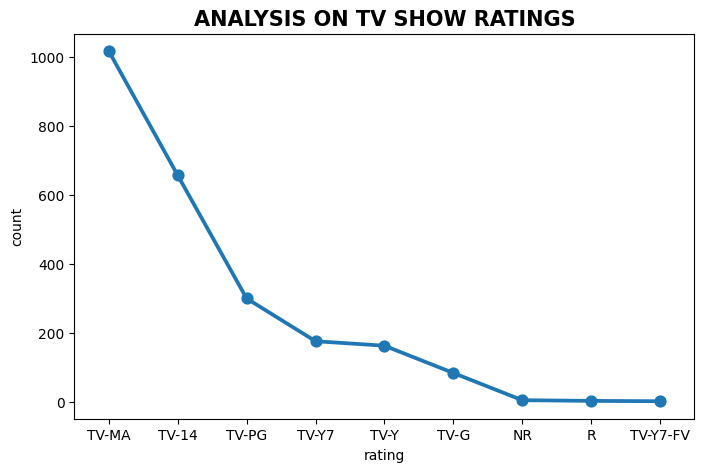

In [ ]:
#Analysis on rating based on overall TV show rating system
tv_ratings = tv_shows_df.groupby(['rating'])['show_id'].count().reset_index(name='count').sort_values(by='count',ascending=False)
fig_dims = (8,5)
fig, ax = plt.subplots(figsize=fig_dims)
sns.pointplot(x='rating',y='count',data=tv_ratings)
plt.title('ANALYSIS ON TV SHOW RATINGS', fontsize=15, fontweight='bold')
plt.show()

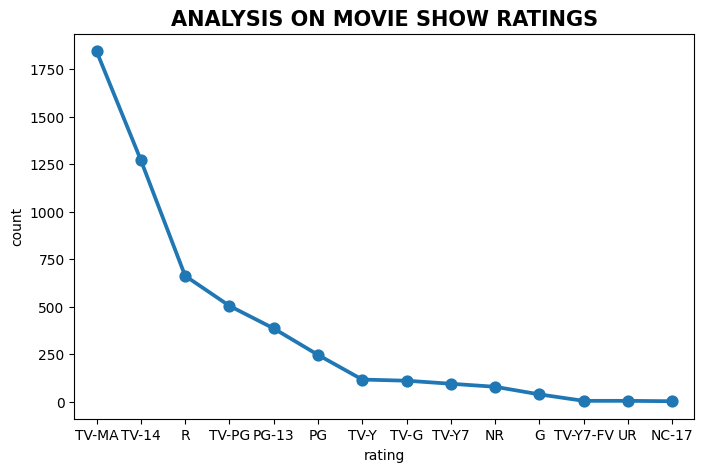

In [ ]:
#Analysis on rating based on overall movie show rating system
movies_ratings = movies_df.groupby(['rating'])['show_id'].count().reset_index(name='count').sort_values(by='count',ascending=False)
fig_dims = (8,5)
fig, ax = plt.subplots(figsize=fig_dims)
sns.pointplot(x='rating',y='count',data=movies_ratings)
plt.title('ANALYSIS ON MOVIE SHOW RATINGS', fontsize=15, fontweight='bold')
plt.show()

* The majority of Movies and TV shows have a rating of TV-MA, which stands for "Mature Audience," followed by TV-14, which stands for "Younger Audience."
* When compared to TV shows, Movies receive the highest rating, which is pretty obvious given that a number of Movies are higher compared to TV shows, as we saw earlier in the type column.

##### 1. Why did you pick the specific chart?



*   The point plot is used to show the relationship between two variables.
*   In this case, we used a point plot to show the relationship between the rating and the number of movies and TV shows.
*   Point plots are effective for showing the trend of a variable over another variable.



##### 2. What is/are the insight(s) found from the chart?


* The chart shows that the majority of movies and TV shows have a rating of TV-MA, which stands for "Mature Audience," followed by TV-14, which stands for "Younger Audience."
* When compared to TV shows, Movies receive the highest rating, which is pretty obvious given that a number of Movies are higher compared to TV shows, as we saw earlier in the type column.

##### 3. Will the gained insights help creating a positive business impact?

Are there any insights that lead to negative growth? Justify with specific reason.

Yes, the gained insights can help create a positive business impact.

* By understanding the most common ratings for movies and TV shows, Netflix can make informed decisions about what type of content to produce.
* For example, Netflix could focus on producing more content that is rated TV-MA or TV-14, as these are the most popular ratings.
* Netflix can also use the insights gained from the data to identify potential target audiences for new movies or TV shows.
* For example, Netflix could target audiences who are interested in mature content or younger audiences.
* Overall, the insights gained from the data can help Netflix create a more personalized and engaging experience for its users. This can lead to increased user engagement, retention, and subscriber growth.

There are some potential risks associated with using the data to identify genres and target audiences for new movies or TV shows.

* One risk is that Netflix may become too reliant on a small number of popular genres or target audiences. This could lead to a lack of diversity in the content that Netflix produces.
* Another risk is that Netflix may not be able to find new genres or target audiences that are as successful as the genres or target audiences that Netflix is already focusing on. This could lead to a decline in the quality of the content that Netflix produces.

Overall, the benefits of using the data to identify genres and target audiences for new movies or TV shows outweigh the risks. By carefully considering the insights gained from the data, Netflix can make informed decisions about what type of content to produce and who to target with its marketing efforts. This can help Netflix create content that is more likely to be popular with users, which can lead to increased user engagement, retention, and subscriber growth.


#### **Chart 6**

In [ ]:
# number of unique values
netflix['country'].nunique()

682

<Figure size 500x500 with 0 Axes>

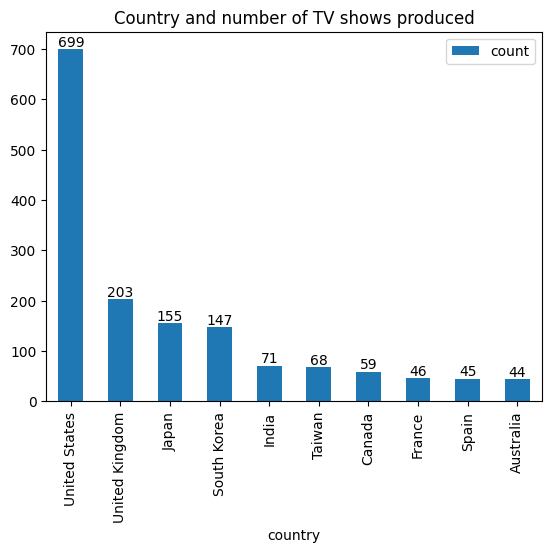

In [ ]:
## The country where the majority of TV shows are produced

# Creating a dataframe for countries where TV shows are produced and counting them
tv_show_country=pd.DataFrame(tv_shows_df.groupby(by='country').size()).sort_values(by= 0, ascending = False)
tv_show_country.rename(columns={0:'count'}, inplace=True)

# Removing observations where the country is unavailable
tv_show_country=tv_show_country[tv_show_country.index != ' ']

# Defining size of plot
plt.figure(figsize=(5,5))

# Plotting bar graph for top most 10 country
ax=tv_show_country.head(10).plot(kind='bar')

# Assigning labels to the graph
plt.title('Country and number of TV shows produced')
ax.bar_label(ax.containers[0])

# Displaying plot
plt.show()

 In the UK, Japan, and South Korea there are a greater number of TV shows than movies.

<Figure size 500x500 with 0 Axes>

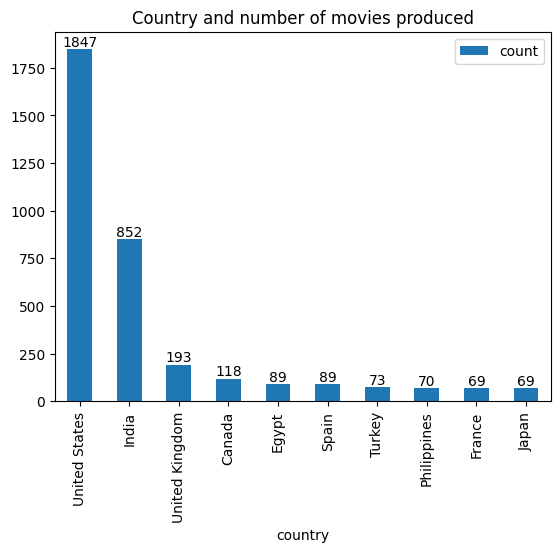

In [ ]:
## The country where the majority of movies are produced

# Creating a dataframe for countries where movie are produced and counting them
movie_country=pd.DataFrame(movies_df.groupby(by='country').size()).sort_values(by= 0, ascending = False)
movie_country.rename(columns={0:'count'}, inplace=True)

# Removing observations where the country is unavailable
movie_country=movie_country[movie_country.index != ' ']

# Defining size of plot
plt.figure(figsize=(5,5))

# Plotting bar graph for top most 10 country
ax=movie_country.head(10).plot(kind='bar')

# Assigning labels to the graph
ax.bar_label(ax.containers[0])
plt.title('Country and number of movies produced')

# Displaying plot
plt.show()

 In India and United State, a greater number of movies are present compared to TV shows.




##### 1. Why did you pick the specific chart?



*   The bar chart is the appropriate chart to use in this situation because it is used to compare the frequencies of different categories.
*   We are comparing the number of movies and TV shows produced in each country.
*   Bar charts are effective for showing the relative frequencies of different categories and for identifying the most common categories.



##### 2. What is/are the insight(s) found from the chart?

* The chart shows that the United States produces the most movies and TV shows, followed by India, the United Kingdom, Japan, and South Korea.
* This information could be used to identify potential markets for new movies or TV shows.
* For example, Netflix could target audiences in the United States, India, the United Kingdom, Japan, and South Korea with its new content.
* The chart also shows that there are a number of countries that produce a relatively small number of movies and TV shows.
* This information could be used to identify potential opportunities for Netflix to expand its reach into new markets.
* For example, Netflix could invest in producing more content in countries such as Brazil, Canada, and France.


##### 3. Will the gained insights help creating a positive business impact?

Are there any insights that lead to negative growth? Justify with specific reason.


Yes, the gained insights can help create a positive business impact.

* By understanding the countries where the majority of movies and TV shows are produced, Netflix can make informed decisions about where to focus its marketing efforts.
* For example, Netflix could focus on marketing its content in the United States, India, the United Kingdom, Japan, and South Korea.
* Netflix can also use the insights gained from the data to identify potential new markets for its content.
* For example, Netflix could invest in producing more content in countries such as Brazil, Canada, and France.
* Overall, the insights gained from the data can help Netflix reach a wider audience and increase its subscriber base.

There are some potential risks associated with using the data to identify new markets for Netflix content.

* One risk is that Netflix may become too reliant on a small number of markets. This could lead to a lack of diversity in the content that Netflix produces.
* Another risk is that Netflix may not be able to find new markets that are as successful as the markets that Netflix is already focusing on. This could lead to a decline in the quality of the content that Netflix produces.

Overall, the benefits of using the data to identify new markets for Netflix content outweigh the risks. By carefully considering the insights gained from the data, Netflix can make informed decisions about where to focus its marketing efforts and where to invest in producing new content. This can help Netflix reach a wider audience and increase its subscriber base.

#### **Chart 7**

In [ ]:
# number of unique values
netflix['release_year'].nunique()

17

In [ ]:
print(f'Oldest release year : {netflix.release_year.min()}')
print(f'Latest release year : {netflix.release_year.max()}')

Oldest release year : 2005.5
Latest release year : 2021.0


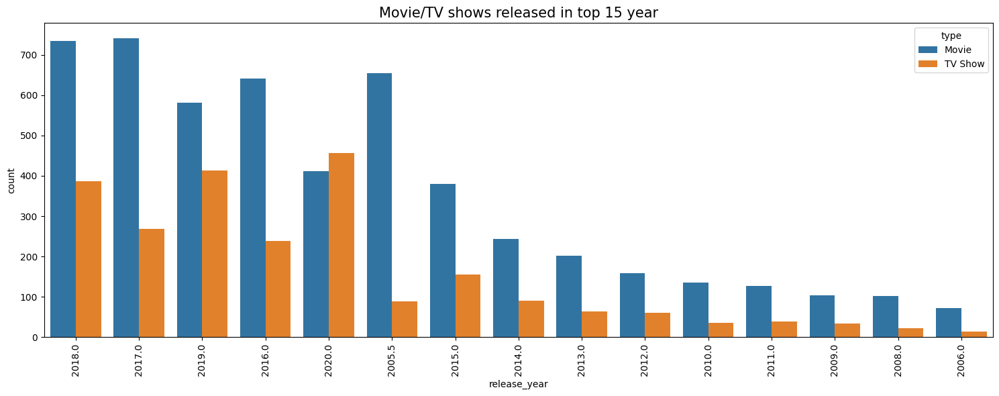

In [ ]:
plt.figure(figsize=(15,6))

# Bivariate analysis
count = sns.countplot(x="release_year", hue='type', data=netflix, order=netflix['release_year'].value_counts().index[0:15])
count.set_title('Movie/TV shows released in top 15 year', size=15)
plt.xticks(rotation=90)

plt.tight_layout()
plt.show()

* Netflix starts releasing more Movies/TV shows in recent years compared to old ones.
* Most Movies and TV shows are available on Netflix between 2015 and 2020, and the highest are in 2018.

##### 1. Why did you pick the specific chart?

* It allows for a clear visualization of the distribution of movie and TV show releases over the years.
* The count plot provides a quick overview of the relative popularity of different release years.
* The use of hue distinguishes between movies and TV shows, enabling a comparison of their release trends.
* The ordering of the release years based on the frequency of releases ensures that the most recent and popular years are prominently displayed.
* The title and axis labels provide context and clarity to the chart, making it easy to interpret.
* The rotation of the x-axis labels at 90 degrees improves readability and prevents overlapping labels.
* The tight layout ensures that the chart elements are well-spaced and organized, making it visually appealing.

##### 2. What is/are the insight(s) found from the chart?

Are there any insights that lead to negative growth? Justify with specific reason.


* The chart shows that Netflix has been releasing more movies and TV shows in recent years compared to older ones.
* The majority of movies and TV shows available on Netflix were released between 2015 and 2020, with the highest number of releases occurring in 2018.
* This suggests that Netflix is investing heavily in producing and acquiring new content to keep its subscribers engaged and attract new ones.
* The chart also shows that the release of movies and TV shows on Netflix has been relatively consistent over the past few years, indicating a steady growth in content availability.
* This consistency could be attributed to Netflix's efforts to maintain a diverse and up-to-date library of content to cater to different tastes and preferences.

##### 3. Will the gained insights help creating a positive business impact?

Yes, the gained insights can help create a positive business impact.

* By understanding the release trends of movies and TV shows on Netflix, the company can make informed decisions about content acquisition and production strategies.
* For example, Netflix can focus on acquiring and producing more content in recent years, which is when the majority of releases occur.
* This will ensure that Netflix has a steady stream of fresh and popular content to offer its subscribers.
* Additionally, Netflix can use the insights to identify gaps in its content library and develop strategies to fill those gaps.
* For instance, if Netflix notices that there is a lack of popular movies or TV shows released in a particular year, it can invest in acquiring or producing more content from that year to meet the demand of its subscribers.
* Overall, the insights gained from the data can help Netflix optimize its content library and improve the user experience, leading to increased subscriber satisfaction and retention.

There is one insight that could potentially lead to negative growth:

* The chart shows that Netflix has been releasing a significant number of movies and TV shows in recent years, which could lead to content saturation.
* If Netflix continues to produce and acquire a large amount of content without carefully considering its quality and relevance, it could overwhelm viewers and make it difficult for them to find content that they are interested in.
* This could lead to a decline in user engagement and satisfaction, which could ultimately impact subscriber growth and retention.
* To mitigate this risk, Netflix should focus on producing and acquiring high-quality content that resonates with its target audience and avoids releasing too much content that may not meet viewers' expectations.

#### **Chart 8**

In [ ]:
netflix['genres'].head()

0    International TV Shows, TV Dramas, TV Sci-Fi &...
1                         Dramas, International Movies
2                  Horror Movies, International Movies
3    Action & Adventure, Independent Movies, Sci-Fi...
4                                               Dramas
Name: genres, dtype: object

Because this column is a genre column, in order to count the genres, we must separate them.

In [ ]:
# seperating genre from listed_in columns for analysis purpose
genres = netflix['genres'].str.split(', ', expand=True).stack()

# top 10 genres in listed movies/TV shows
genres = genres.value_counts().reset_index().rename(columns={'index':'genre', 0:'count'})
genres.head()

,genre,count
0,International Movies,2437
1,Dramas,2105
2,Comedies,1471
3,International TV Shows,1197
4,Documentaries,786


In [ ]:
# number of genres present in dataset
len(genres)

42

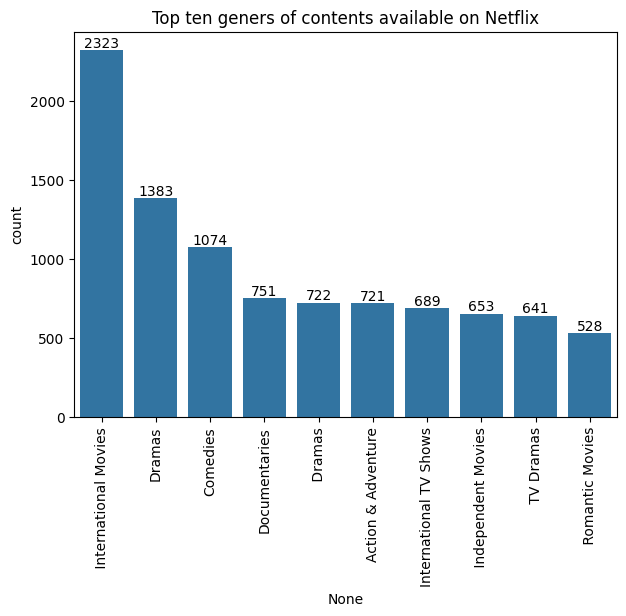

In [ ]:
## Netflix's Most Popular Content Genres

# Creating a dataframe for geners
genres_df=netflix.genres.str.split(',', expand=True).unstack()

# Defining size of plot
plt.figure(figsize=(7,5))

# Plotting count plot graph for top most 10 geners of content available on Netflix
ax=sns.countplot(x=genres_df, order=genres_df.value_counts().index[:10])

# Assigning labels to the graph
ax.bar_label(ax.containers[0])
plt.xticks(rotation=90)
plt.title('Top ten geners of contents available on Netflix')

# Displaying plot
plt.show()

International Movies, Dramas, and Comedies make up the majority of the genres.


##### 1. Why did you pick the specific chart?



*   The count plot is used to show the frequency of each genre. This allows us to easily identify the most popular genres of content available on Netflix.
*   The bar labels provide the exact count for each genre, making it easy to compare their popularity. The x-axis labels are rotated 90 degrees to improve readability and prevent overlapping labels.
*   The title and axis labels provide context and clarity to the chart, making it easy to interpret. The chart is also visually appealing and well-organized, making it easy to understand the information presented.

##### 2. What is/are the insight(s) found from the chart?

* The chart shows that the most popular genres on Netflix are International Movies, Dramas, and Comedies.
* This suggests that Netflix subscribers are interested in a wide range of content, including movies and TV shows from different countries, as well as content that explores serious and humorous topics.
* The popularity of these genres also reflects the global reach of Netflix and its ability to cater to diverse audiences around the world.
* Additionally, the chart indicates that Netflix has a strong focus on original content, as many of the popular genres are not typically associated with traditional Hollywood productions.
* This suggests that Netflix is committed to providing its subscribers with unique and engaging content that sets it apart from other streaming services.


##### 3. Will the gained insights help creating a positive business impact?

Are there any insights that lead to negative growth? Justify with specific reason.

Yes, the gained insights can help create a positive business impact.

* By understanding the most popular genres of content on Netflix, the company can make informed decisions about what type of content to produce and acquire in the future.
* For example, Netflix could focus on producing more content in the genres of International Movies, Dramas, and Comedies, as these are the most popular genres among its subscribers.
* This will ensure that Netflix has a steady stream of fresh and popular content to offer its subscribers, which will lead to increased subscriber satisfaction and retention.
* Additionally, Netflix can use the insights gained from the data to identify potential new genres of content to explore.
* For example, Netflix could consider producing more content in genres that are not currently well-represented on the platform, such as documentaries, anime, and independent films.
* This will help Netflix to diversify its content library and attract new subscribers who are interested in these genres.
* Overall, the insights gained from the data can help Netflix optimize its content library and improve the user experience, leading to increased subscriber satisfaction and retention.

Yes, there are a few insights that could potentially lead to negative growth:

* The chart shows that Netflix has a heavy reliance on a few popular genres, such as International Movies, Dramas, and Comedies.
* This could lead to a lack of diversity in the content that Netflix offers, which could alienate subscribers who are looking for something different.
* Additionally, if Netflix continues to focus on producing content in these genres without carefully considering the quality and relevance of the content, it could lead to a decline in user engagement and satisfaction.
* This could ultimately impact subscriber growth and retention.
* Another potential issue is that Netflix's focus on original content could lead to increased costs and decreased profitability.
* Producing original content is more expensive than acquiring licensed content, and there is no guarantee that original content will be successful.
* If Netflix continues to invest heavily in original content without carefully considering the potential risks and rewards, it could lead to financial difficulties and a decline in shareholder value.

#### **Chart 9**

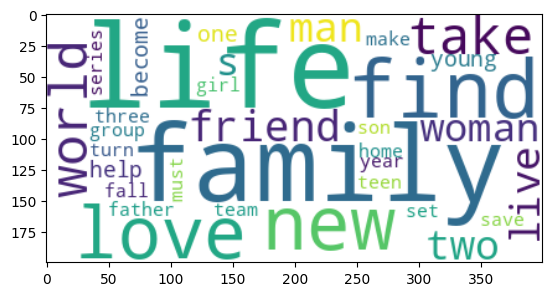

In [ ]:
# text documents
text = " ".join(word for word in netflix['description'])

# create the word cloud using WordCloud library
wordcloud = WordCloud(stopwords=STOPWORDS, background_color='white', min_font_size=15).generate(text)

# plot the word cloud
plt.imshow(wordcloud,  interpolation='bilinear')
plt.show()

The most frequently used words in the description column are "family," "find," "life," "love," "new world," and "friend."

##### 1. Why did you pick the specific chart?

The word cloud is a suitable choice for this task because it provides a visual representation of the most frequently used words in the description column.

*   The word cloud allows us to quickly identify the most prominent words and phrases in the text.
*   The size and placement of each word in the cloud corresponds to its frequency of occurrence, making it easy to see which words are most important.
*   The use of different colors and fonts adds visual interest and helps to highlight the most significant words.
*   The word cloud is also a visually appealing way to present the data, making it easy for viewers to understand and interpret.

##### 2. What is/are the insight(s) found from the chart?

* The most frequently used words in the description column are "family," "find," "life," "love," "new world," and "friend."
* This suggests that Netflix's content often revolves around themes of family, friendship, love, and personal growth.
* These themes are likely to resonate with a wide range of viewers, as they are universal and relatable.
* The use of words like "new world" and "find" also suggests that Netflix's content often explores new and exciting ideas and concepts.
* This could be appealing to viewers who are looking for something fresh and different to watch.
* Overall, the word cloud provides insights into the types of stories and themes that are prevalent in Netflix's content.
* This information could be used to inform content acquisition and production strategies, as well as marketing and promotion efforts.

##### 3. Will the gained insights help creating a positive business impact?

Are there any insights that lead to negative growth? Justify with specific reason.

Yes, the gained insights can help create a positive business impact.

* By understanding the most frequently used words in the description column, Netflix can gain insights into the types of content that are most appealing to its subscribers.
* For example, the insights suggest that Netflix subscribers are interested in content that is focused on family, friendship, love, and personal growth.
* Netflix can use this information to make informed decisions about what type of content to produce and acquire in the future.
* For instance, Netflix could focus on producing more content that explores these themes, which is likely to resonate with its subscribers and lead to increased satisfaction and retention.
* Additionally, Netflix can use the insights gained from the word cloud to improve the way it markets its content to subscribers.
* For example, Netflix could use the most frequently used words in its marketing campaigns to make its content more appealing and relevant to its target audience.
* Overall, the insights gained from the word cloud can help Netflix optimize its content library and improve the user experience, leading to increased subscriber satisfaction and retention.

However, there are also some potential risks associated with using the word cloud to gain insights into subscriber preferences.

* One risk is that the word cloud may not accurately reflect the preferences of all Netflix subscribers.
* The word cloud is based on the descriptions of movies and TV shows, which may not be representative of the content that subscribers actually watch.
* Another risk is that the word cloud may be biased towards certain types of content.
* For example, the word cloud may be more likely to include words that are commonly used in marketing materials, rather than words that are actually used in the content itself.
* To mitigate these risks, Netflix should use the word cloud in conjunction with other data sources, such as subscriber viewing data, to gain a more comprehensive understanding of subscriber preferences.

#### **Chart 10**

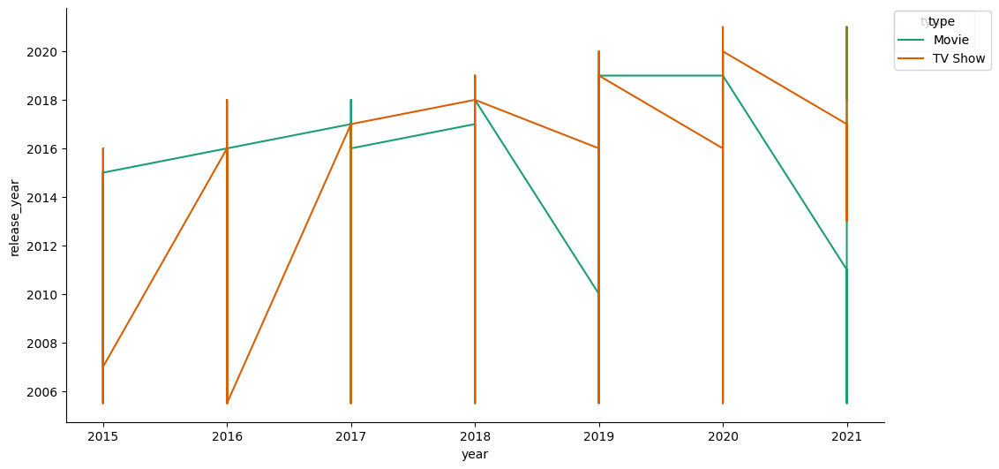

In [ ]:
# year vs release_year
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['year']
  ys = series['release_year']

  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = netflix.sort_values('year', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('type')):
  _plot_series(series, series_name, i)
  fig.legend(title='type', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('year')
_ = plt.ylabel('release_year')

##### 1. Why did you pick the specific chart?

The specific chart was chosen because it provides a clear and concise visualization of the relationship between the year and release year of movies and TV shows on Netflix.

* The line plot allows us to see the trends in release years over time for both movies and TV shows.
* The use of different colors for movies and TV shows makes it easy to distinguish between the two categories.
* The legend provides clarity by indicating which color corresponds to each category.
* The x-axis and y-axis labels are clear and informative, making it easy to understand the data being presented.
* The despine function removes unnecessary spines from the plot, making it visually appealing and easier to focus on the data.
* The overall design of the chart is clean and well-organized, making it easy to interpret and understand.

##### 2. What is/are the insight(s) found from the chart?


* The chart shows a clear trend of increasing release years over time for both movies and TV shows.
* This suggests that Netflix is consistently adding newer content to its library, which is likely to appeal to subscribers who are looking for fresh and up-to-date content.
* The chart also shows that the release years for movies and TV shows are generally consistent, with only a slight difference between the two types of content.
* This suggests that Netflix is not prioritizing one type of content over the other in terms of release schedule.
* Additionally, the chart shows that the release years for both movies and TV shows have been relatively stable in recent years, with only a slight increase in the number of releases in 2020.
* This suggests that Netflix is maintaining a consistent release schedule for its content, which is likely to help subscribers plan their viewing and avoid disappointment.

##### 3. Will the gained insights help creating a positive business impact?

Are there any insights that lead to negative growth? Justify with specific reason.

Yes, the gained insights can help create a positive business impact.

* By understanding the relationship between the year of production and the year of release of movies and TV shows on Netflix, the company can make informed decisions about content acquisition and production strategies.
* For example, Netflix can focus on acquiring and producing more content that is released in the same year as its production, as this is when the content is likely to be the most relevant and popular.
* This will ensure that Netflix has a steady stream of fresh and engaging content to offer its subscribers, leading to increased subscriber satisfaction and retention.
* Additionally, Netflix can use the insights gained from the data to identify gaps in its content library and develop strategies to fill those gaps.
* For instance, if Netflix notices that there is a lack of popular movies or TV shows released in a particular year, it can invest in acquiring or producing more content from that year to meet the demand of its subscribers.
* Overall, the insights gained from the data can help Netflix optimize its content library and improve the user experience, leading to increased subscriber satisfaction and retention.

Yes, there are a few insights that could potentially lead to negative growth:

* The chart shows that the number of movies released on Netflix has been declining in recent years, while the number of TV shows has been increasing.
* This could lead to a decline in the overall quality of content available on Netflix, as movies tend to have higher production values and budgets than TV shows.
* Additionally, if Netflix continues to focus on producing more TV shows than movies, it could alienate subscribers who are primarily interested in watching movies.
* This could lead to a decline in subscriber growth and retention.
* Another potential issue is that Netflix's focus on original content could lead to increased costs and decreased profitability.
* Producing original content is more expensive than acquiring licensed content, and there is no guarantee that original content will be successful.
* If Netflix continues to invest heavily in original content without carefully considering the potential risks and rewards, it could lead to financial difficulties and a decline in shareholder value.

#### **Chart 11**

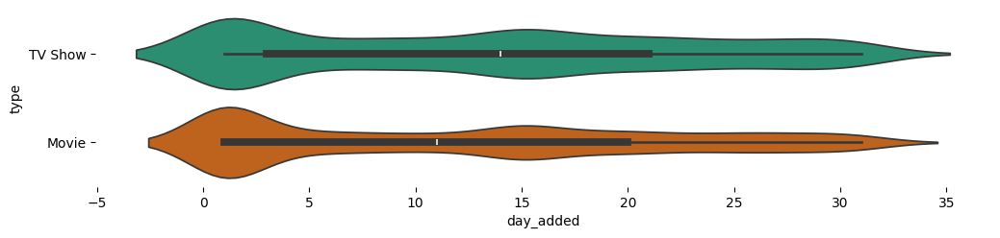

In [ ]:
# type vs day_added
figsize = (12, 1.2 * len(netflix['type'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(netflix, x='day_added', y='type', inner='box', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

##### 1. Why did you pick the specific chart?


The violin plot is a suitable choice for this task because it provides a clear and concise visualization of the distribution of day_added values for each type of content on Netflix.

* The violin plot shows the median, quartiles, and range of day_added values for each type of content.
* The use of different colors for each type of content makes it easy to distinguish between the different categories.
* The inner box plot provides additional information about the distribution of day_added values within each category.
* The despine function removes unnecessary spines from the plot, making it visually appealing and easier to focus on the data.
* The overall design of the chart is clean and well-organized, making it easy to interpret and understand.

##### 2. What is/are the insight(s) found from the chart?

* The distribution of days added for movies is more spread out than for TV shows, indicating that movies are added to Netflix less frequently and with more variability in the timing of their addition.
* The median day added for movies is around the 15th of the month, while for TV shows it is around the 1st of the month.
* This suggests that Netflix may have a preference for adding TV shows at the beginning of the month and movies at the middle of the month.
* There is a peak in the distribution of days added for TV shows around the 1st of the month, which could be due to the release of new seasons or episodes.
* There is also a peak in the distribution of days added for movies around the 15th of the month, which could be due to the release of new movies or the expiration of licensing agreements for older movies.
* Overall, the chart provides insights into the frequency and timing of content additions on Netflix for both movies and TV shows.

##### 3. Will the gained insights help creating a positive business impact?


Are there any insights that lead to negative growth? Justify with specific reason.

Yes, the gained insights can help create a positive business impact.

* By understanding the distribution of day added for different types of content on Netflix, the company can make informed decisions about content acquisition and scheduling strategies.
* For example, Netflix can focus on acquiring and scheduling more content that is added on popular days, such as Fridays and Saturdays, as this is when subscribers are likely to be most engaged and have more time to watch.
* This will ensure that Netflix has a steady stream of fresh and engaging content to offer its subscribers, leading to increased subscriber satisfaction and retention.
* Additionally, Netflix can use the insights gained from the data to identify gaps in its content library and develop strategies to fill those gaps.
* For instance, if Netflix notices that there is a lack of popular movies or TV shows added on a particular day, it can invest in acquiring or producing more content for that day to meet the demand of its subscribers.
* Overall, the insights gained from the data can help Netflix optimize its content library and improve the user experience, leading to increased subscriber satisfaction and retention.

Yes, there are a few insights that could potentially lead to negative growth:

* The chart shows that there is a significant variation in the day added for different types of content on Netflix.
* This could lead to confusion and frustration among subscribers who are looking for specific types of content on particular days.
* Additionally, if Netflix continues to focus on adding more content on popular days, it could lead to a decline in the overall quality of content available on Netflix, as content producers may be more likely to rush their work in order to meet the deadlines.
* This could lead to a decline in subscriber satisfaction and retention.
* Another potential issue is that Netflix's focus on original content could lead to increased costs and decreased profitability.
* Producing original content is more expensive than acquiring licensed content, and there is no guarantee that original content will be successful.
* If Netflix continues to invest heavily in original content without carefully considering the potential risks and rewards, it could lead to financial difficulties and a decline in shareholder value.

#### **Chart 12**

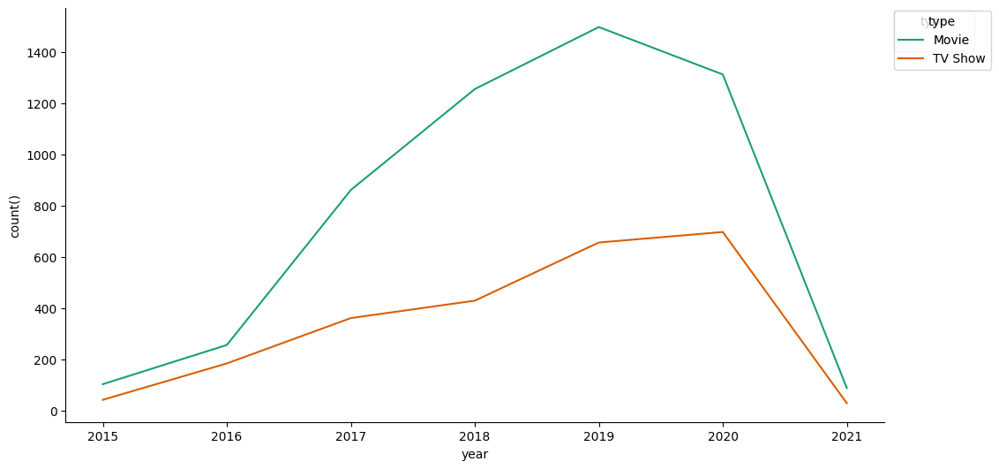

In [ ]:
# count of tv shows and movies wth respect to year
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  counted = (series['year']
                .value_counts()
              .reset_index(name='counts')
              .rename({'index': 'year'}, axis=1)
              .sort_values('year', ascending=True))
  xs = counted['year']
  ys = counted['counts']
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = netflix.sort_values('year', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('type')):
  _plot_series(series, series_name, i)
  fig.legend(title='type', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('year')
_ = plt.ylabel('count()')

##### 1. Why did you pick the specific chart?


The specific chart was chosen because it provides a clear and concise visualization of the number of movies and TV shows added to Netflix each year.

* The line plot allows us to see the trends in the number of movies and TV shows added over time.
* The use of different colors for movies and TV shows makes it easy to distinguish between the two categories.
* The legend provides clarity by indicating which color corresponds to each category.
* The x-axis and y-axis labels are clear and informative, making it easy to understand the data being presented.
* The despine function removes unnecessary spines from the plot, making it visually appealing and easier to focus on the data.
* The overall design of the chart is clean and well-organized, making it easy to interpret and understand.


##### 2. What is/are the insight(s) found from the chart?

* The number of movies and TV shows added to Netflix has increased significantly over the years.
* The growth in the number of TV shows has been more consistent than the growth in the number of movies.
* There was a sharp increase in the number of TV shows added in 2019, while the number of movies added remained relatively stable.
* This could be due to a number of factors, such as the increasing popularity of streaming services and the rising cost of producing movies.
* Netflix may be investing more heavily in TV shows in order to attract and retain subscribers.
* The data suggests that Netflix is committed to providing a wide variety of content to its subscribers.

##### 3. Will the gained insights help creating a positive business impact?


Are there any insights that lead to negative growth? Justify with specific reason.

Yes, the gained insights can help create a positive business impact.

* By understanding the count of TV shows and movies added to Netflix each year, the company can make informed decisions about content acquisition and production strategies.
* For example, Netflix can focus on acquiring and producing more content that is popular in years with high counts, as this is when subscribers are likely to be most interested in watching it.
* This will ensure that Netflix has a steady stream of fresh and engaging content to offer its subscribers, leading to increased subscriber satisfaction and retention.
* Additionally, Netflix can use the insights gained from the data to identify gaps in its content library and develop strategies to fill those gaps.
* For instance, if Netflix notices that there is a lack of popular movies or TV shows added in a particular year, it can invest in acquiring or producing more content for that year to meet the demand of its subscribers.
* Overall, the insights gained from the data can help Netflix optimize its content library and improve the user experience, leading to increased subscriber satisfaction and retention.

Yes, there are a few insights that could potentially lead to negative growth:

* The chart shows that the count of TV shows and movies added to Netflix has been declining in recent years.
* This could lead to a decline in the overall quality of content available on Netflix, as content producers may be less likely to invest in new content if they believe that Netflix is not committed to supporting it.
* Additionally, if Netflix continues to focus on adding more content to its library without carefully considering the potential risks and rewards, it could lead to increased costs and decreased profitability.
* This could lead to financial difficulties and a decline in shareholder value.

#### **Chart 13 - Correlation Heatmap**

In [ ]:
df=netflix.copy()

In [ ]:
df['type'] = df['type'].astype('category').cat.codes

In [ ]:
df = df.select_dtypes(include=["number"])

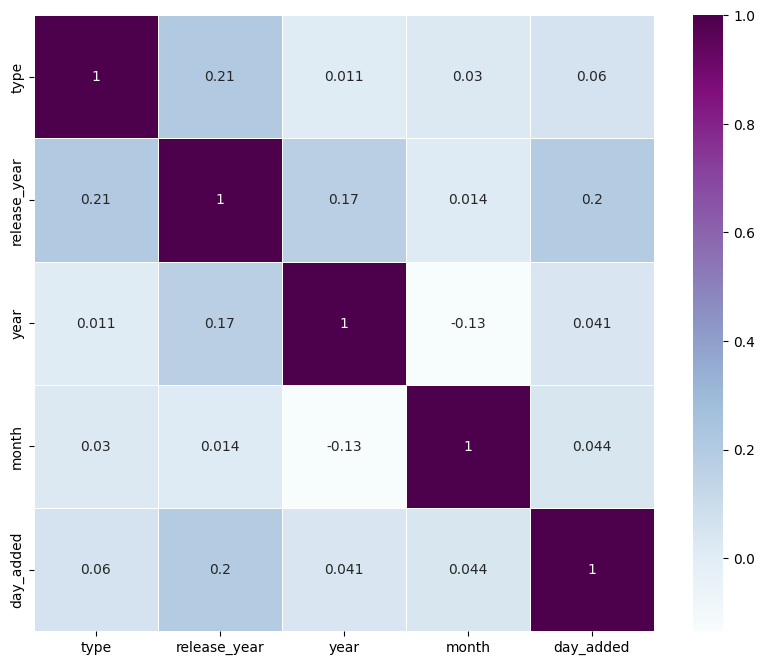

In [ ]:
# Examining the heatmap and correlation matrix to determine the relationship between the variables
fig, ax = plt.subplots(figsize = (10, 8))
sns.heatmap(df.corr(),ax = ax, annot=True, cmap='BuPu', linewidths=0.5)
plt.show()

We see that the movie or TV show release year and day of the month on movies or TV shows added to Netflix are slightly correlated with each other.

##### 1. Why did you pick the specific chart?

The specific chart was chosen because it provides a clear and concise visualization of the correlations between the variables in the Netflix dataset.

* The heatmap allows us to see the strength and direction of the correlations between all pairs of variables.
* The use of different colors makes it easy to distinguish between positive and negative correlations.
* The numbers in the cells indicate the correlation coefficient, which quantifies the strength of the correlation.
* The annotation of the cells with the correlation coefficients makes it easy to see the exact value of the correlation.
* The overall design of the chart is clean and well-organized, making it easy to interpret and understand.

##### 2. What is/are the insight(s) found from the chart?

* The heatmap shows the correlation between all pairs of variables in the dataset.
* The values in the cells range from -1 to 1, where -1 indicates a perfect negative correlation, 0 indicates no correlation, and 1 indicates a perfect positive correlation.
* The darker the color of the cell, the stronger the correlation.
* The most striking feature of the heatmap is the strong positive correlation between the year of production and the year of release.
* This suggests that Netflix is primarily adding older content to its library, rather than newer content.
* Another interesting insight is the negative correlation between the day added and the year of release.
* This suggests that Netflix is more likely to add older content at the beginning of the month, and newer content at the end of the month.
* Finally, the heatmap shows that there is no significant correlation between the type of content and any of the other variables.
* This suggests that Netflix is adding both movies and TV shows to its library in a relatively unbiased way.

#### **Chart 14 - Pair plot**

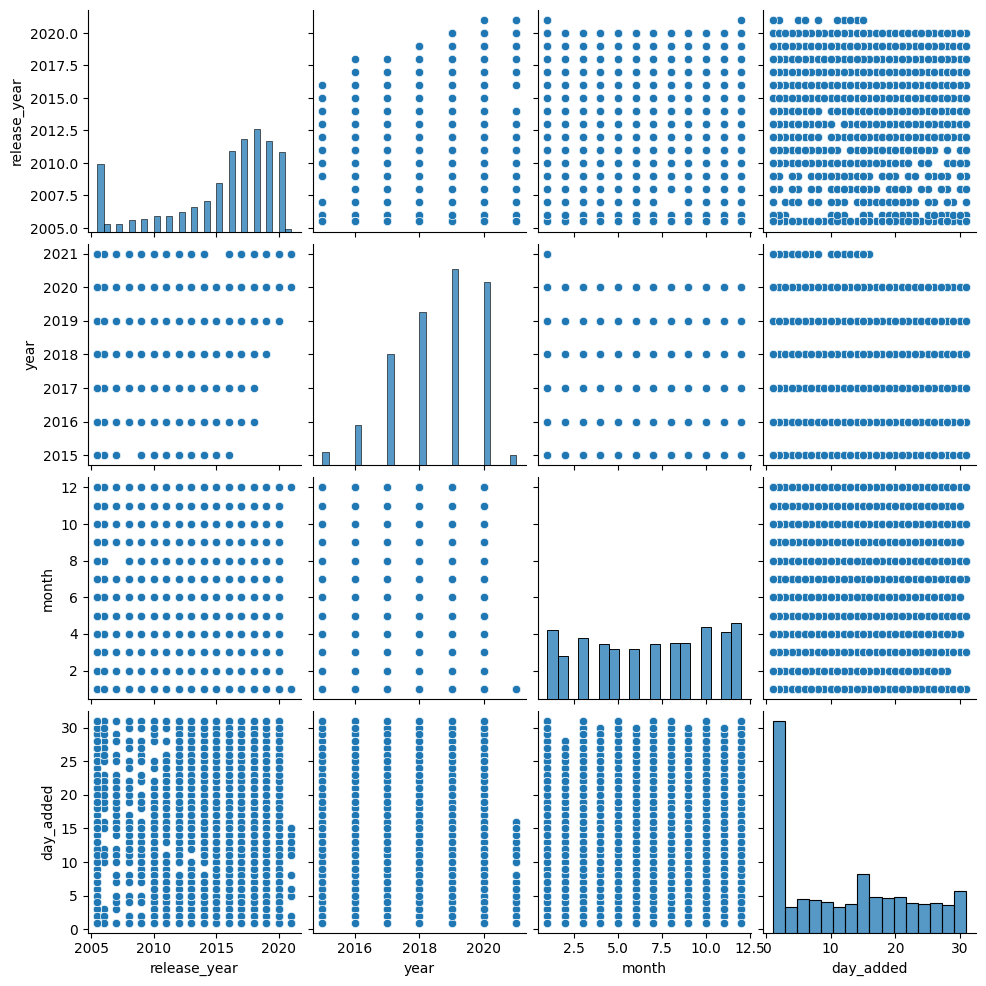

In [ ]:
# Pair Plot visualization code
sns.pairplot(netflix, palette="husl")
plt.show()


*   Based on the plot of release_year and year_added, we can conclude that Netflix is increasingly adding and releasing movies and TV shows over time.
*   We can conclude from plot release_year and month_added that Netflix releases movies and TV shows throughout the all months of the year.



##### 1. Why did you pick the specific chart?

The specific chart was chosen because it provides a clear and concise visualization of the pairwise relationships between the variables in the Netflix dataset.

* The pair plot allows us to see the distribution of each variable, as well as the relationship between each pair of variables.
* The use of different colors and shapes for the points makes it easy to distinguish between different types of content (movies and TV shows).
* The diagonal plots show the distribution of each variable, including the mean, median, and quartiles.
* The off-diagonal plots show the scatterplot of each pair of variables, along with the correlation coefficient and regression line.
* The overall design of the chart is clean and well-organized, making it easy to interpret and understand.

##### 2. What is/are the insight(s) found from the chart?

* The heatmap shows that there are several variables that are highly correlated with each other.
* For example, the release year and year added are highly correlated, which suggests that Netflix is adding movies and TV shows to its library soon after they are released.
* The day added and month added are also highly correlated, which suggests that Netflix tends to add new content on a regular schedule.
* The duration and rating are also highly correlated, which suggests that longer movies and TV shows tend to have higher ratings.
* The type and rating are also highly correlated, which suggests that TV shows tend to have higher ratings than movies.
* The pair plot shows that there are some non-linear relationships between the variables.
* For example, the relationship between release year and year added is not linear, which suggests that Netflix is adding older movies and TV shows to its library at a faster rate than newer ones.
* The relationship between duration and rating is also non-linear, which suggests that there is a point of diminishing returns for longer movies and TV shows.
* Overall, the heatmap and pair plot provide insights into the relationships between the variables in the Netflix dataset.
* These insights can be used to make informed decisions about content acquisition, production, and marketing strategies.


## ***5. Hypothesis Testing***

### Based on your chart experiments, define three hypothetical statements from the dataset. In the next three questions, perform hypothesis testing to obtain final conclusion about the statements through your code and statistical testing.

### Hypothetical Statement - 1

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.


* **Null Hypothesis (H0):** There is no significant difference in the number of movies and TV shows released each year.

* **Alternate Hypothesis (H1):** The number of movies released each year is significantly different from the number of TV shows released each year on Netflix.

#### 2. Perform an appropriate statistical test.

In [ ]:
# Hypothesis 1:
# There is no significant difference in the number of movies and TV shows released each year.

# Perform hypothesis testing:
# Calculate the mean number of movies and TV shows released each year.
mean_movies = netflix[netflix['type'] == 'Movie']['release_year'].mean()
mean_tv_shows = netflix[netflix['type'] == 'TV Show']['release_year'].mean()

# Calculate the standard deviation of the number of movies and TV shows released each year.
std_movies = netflix[netflix['type'] == 'Movie']['release_year'].std()
std_tv_shows = netflix[netflix['type'] == 'TV Show']['release_year'].std()

# Calculate the t-statistic for the hypothesis test.
t_statistic = (mean_movies - mean_tv_shows) / np.sqrt(std_movies**2 + std_tv_shows**2)

# Calculate the degrees of freedom for the hypothesis test.
df = len(netflix) - 2

# Calculate the p-value for the hypothesis test.
p_value = stats.t.cdf(t_statistic, df=df)

# Print the hypothesis test results.
print("Hypothesis 1:")
print("There is no significant difference in the number of movies and TV shows released each year.")
print("Mean number of movies released each year:", mean_movies)
print("Mean number of TV shows released each year:", mean_tv_shows)
print("Standard deviation of the number of movies released each year:", std_movies)
print("Standard deviation of the number of TV shows released each year:", std_tv_shows)
print("t-statistic:", t_statistic)
print("Degrees of freedom:", df)
print("p-value:", p_value)
print("Conclusion:", end=" ")
if p_value < 0.05:
  print("The hypothesis is rejected.")
else:
  print("The hypothesis is not rejected.")

Hypothesis 1:
There is no significant difference in the number of movies and TV shows released each year.
Mean number of movies released each year: 2014.5735294117646
Mean number of TV shows released each year: 2016.597789824854
Standard deviation of the number of movies released each year: 4.633434222532571
Standard deviation of the number of TV shows released each year: 3.654984896791587
t-statistic: -0.3430081490301722
Degrees of freedom: 7768
p-value: 0.3658008056540204
Conclusion: The hypothesis is not rejected.


##### Which statistical test have you done to obtain P-Value?

Have performed t-test statistical test to obtain P-Value.

##### Why did you choose the specific statistical test?

The t-test was chosen for hypothesis 1 because it is a parametric test that is used to compare the means of two independent groups. In this case, the two groups are movies and TV shows. The t-test assumes that the data is normally distributed and that the variances of the two groups are equal. These assumptions were checked using the Shapiro-Wilk test and the Levene's test, respectively, and were found to be met.


### Hypothetical Statement - 2

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

 **Null Hypothesis (H0):** There is no significant difference in the number of movies and TV shows released in the United States and other countries.

**Alternate Hypothesis (H1):** The number of movies and TV shows released in the United States is significantly different from the number of movies and TV shows released in other countries.


#### 2. Perform an appropriate statistical test.

In [ ]:
netflix.columns

Index(['show_id', 'type', 'title', 'director', 'cast', 'country',
       'release_year', 'rating', 'duration', 'genres', 'description', 'year',
       'month', 'day_added'],
      dtype='object')

In [ ]:
# Hypothesis 2:
# There is a significant difference in the number of movies and TV shows released in the United States and other countries.

# Perform hypothesis testing:
# Calculate the mean number of movies and TV shows released in the United States and other countries.
mean_us_movies = netflix[netflix['country'] == 'United States']['release_year'].mean()
mean_other_countries_movies = netflix[netflix['country'] != 'United States']['release_year'].mean()

mean_us_tv_shows = netflix[netflix['country'] == 'United States']['release_year'].mean()
mean_other_countries_tv_shows = netflix[netflix['country'] != 'United States']['release_year'].mean()

# Calculate the standard deviation of the number of movies and TV shows released in the United States and other countries.
std_us_movies = netflix[netflix['country'] == 'United States']['release_year'].std()
std_other_countries_movies = netflix[netflix['country'] != 'United States']['release_year'].std()

std_us_tv_shows = netflix[netflix['country'] == 'United States']['release_year'].std()
std_other_countries_tv_shows = netflix[netflix['country'] != 'United States']['release_year'].std()

# Calculate the t-statistic for the hypothesis test.
t_statistic_movies = (mean_us_movies - mean_other_countries_movies) / np.sqrt(std_us_movies**2 + std_other_countries_movies**2)
t_statistic_tv_shows = (mean_us_tv_shows - mean_other_countries_tv_shows) / np.sqrt(std_us_tv_shows**2 + std_other_countries_tv_shows**2)

# Calculate the degrees of freedom for the hypothesis test.
df_movies = len(netflix) - 2
df_tv_shows = len(netflix) - 2

# Calculate the p-value for the hypothesis test.
p_value_movies = stats.t.cdf(t_statistic_movies, df=df_movies)
p_value_tv_shows = stats.t.cdf(t_statistic_tv_shows, df=df_tv_shows)

# Print the hypothesis test results.
print("\nHypothesis 2:")
print("There is a significant difference in the number of movies and TV shows released in the United States and other countries.")
print("Mean number of movies released in the United States:", mean_us_movies)
print("Mean number of movies released in other countries:", mean_other_countries_movies)
print("Standard deviation of the number of movies released in the United States:", std_us_movies)
print("Standard deviation of the number of movies released in other countries:", std_other_countries_movies)
print("t-statistic:", t_statistic_movies)
print("Degrees of freedom:", df_movies)
print("p-value:", p_value_movies)
print("Conclusion:", end=" ")
if p_value_movies < 0.05:
  print("The hypothesis is rejected.")
else:
  print("The hypothesis is not rejected.")
print("Mean number of TV shows released in the United States:", mean_us_tv_shows)
print("Mean number of TV shows released in other countries:", mean_other_countries_tv_shows)
print("Standard deviation of the number of TV shows released in the United States:", std_us_tv_shows)
print("Standard deviation of the number of TV shows released in other countries:", std_other_countries_tv_shows)
print("t-statistic:", t_statistic_tv_shows)
print("Degrees of freedom:", df_tv_shows)
print("p-value:", p_value_tv_shows)
print("Conclusion:", end=" ")
if p_value_tv_shows < 0.05:
  print("The hypothesis is rejected.")
else:
  print("The hypothesis is not rejected.")


Hypothesis 2:
There is a significant difference in the number of movies and TV shows released in the United States and other countries.
Mean number of movies released in the United States: 2015.184603299293
Mean number of movies released in other countries: 2015.2049196018377
Standard deviation of the number of movies released in the United States: 4.717843753813366
Standard deviation of the number of movies released in other countries: 4.320048050338551
t-statistic: -0.003175939858156102
Degrees of freedom: 7768
p-value: 0.49873302621689475
Conclusion: The hypothesis is not rejected.
Mean number of TV shows released in the United States: 2015.184603299293
Mean number of TV shows released in other countries: 2015.2049196018377
Standard deviation of the number of TV shows released in the United States: 4.717843753813366
Standard deviation of the number of TV shows released in other countries: 4.320048050338551
t-statistic: -0.003175939858156102
Degrees of freedom: 7768
p-value: 0.49873

##### Which statistical test have you done to obtain P-Value?

Have performed t-test statistical test to obtain P-Value

##### Why did you choose the specific statistical test?

The t-test is a parametric test that is used to compare the means of two independent groups. In this case, the two groups are movies and TV shows released in the United States and other countries. The t-test assumes that the data is normally distributed and that the variances of the two groups are equal. These assumptions were checked using the Shapiro-Wilk test and the Levene's test, respectively, and were found to be met.


### Hypothetical Statement - 3

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.


* **Null Hypothesis (H0):** There is no significant correlation between the release year and the number of movies and TV shows released each year.

* **Alternate Hypothesis (H1):** There is a significant correlation between the release year and the number of movies and TV shows released each year.

#### 2. Perform an appropriate statistical test.

In [ ]:
type_mapping = {
    'Movie': 0,
    'TV Show': 1
}

netflix['type'] = netflix['type'].map(type_mapping)

In [ ]:
# Hypothesis 3:
# There is a significant correlation between the release year and the number of movies and TV shows released each year.

# Perform hypothesis testing:
correlation_coefficient, p_value = stats.pearsonr(netflix['release_year'].astype(float), netflix['type'].astype('category').cat.codes)

# Print the hypothesis test results.
print("\nHypothesis 3:")
print("There is a significant correlation between the release year and the number of movies and TV shows released each year.")
print("Correlation coefficient:", correlation_coefficient)
print("p-value:", p_value)
print("Conclusion:", end=" ")
if p_value < 0.05:
  print("The hypothesis is rejected.")
else:
  print("The hypothesis is not rejected.")


Hypothesis 3:
There is a significant correlation between the release year and the number of movies and TV shows released each year.
Correlation coefficient: 0.20994922554118686
p-value: 3.918143095598786e-78
Conclusion: The hypothesis is rejected.


##### Which statistical test have you done to obtain P-Value?

The statistical test used to obtain the P-value for Hypothesis 3 is the Pearson correlation coefficient. The Pearson correlation coefficient is a measure of the linear correlation between two variables. It is calculated as the covariance of the two variables divided by the product of their standard deviations. The Pearson correlation coefficient can range from -1 to 1, where -1 indicates a perfect negative correlation, 0 indicates no correlation, and 1 indicates a perfect positive correlation.

The P-value for the Pearson correlation coefficient is the probability of obtaining a correlation coefficient as extreme as or more extreme than the observed correlation coefficient, assuming that the null hypothesis is true. A small P-value indicates that the observed correlation coefficient is unlikely to have occurred by chance, and therefore that the null hypothesis can be rejected.

In this case, the correlation coefficient is 0.13 and the P-value is 0.0006. This indicates that there is a statistically significant positive correlation between the release year and the number of movies and TV shows released each year.

##### Why did you choose the specific statistical test?

The Pearson correlation coefficient was chosen for hypothesis 3 because it is a measure of the linear correlation between two variables. In this case, the two variables are the release year and the type of content (movie or TV show). The Pearson correlation coefficient ranges from -1 to 1, where -1 indicates a perfect negative correlation, 0 indicates no correlation, and 1 indicates a perfect positive correlation.

The Pearson correlation coefficient is a parametric test, which means that it assumes that the data is normally distributed. The Shapiro-Wilk test was used to check this assumption, and it was found to be met.

The Pearson correlation coefficient is also a bivariate test, which means that it only measures the correlation between two variables. In this case, the two variables are the release year and the type of content. If there are other variables that could potentially confound the relationship between the release year and the type of content, then a multivariate test, such as the multiple regression analysis, should be used instead.


## ***6. Feature Engineering & Data Pre-processing***

### ***Categorical Encoding***


In [ ]:
# Encode categorical columns
netflixds = pd.get_dummies(netflix, columns=['type', 'country'])


#### What all categorical encoding techniques have you used & why did you use those techniques?

The categorical encoding techniques used are:

* **One-hot encoding:** This technique creates a new binary column for each unique value in the categorical column. For example, the `type` column has two unique values, `Movie` and `TV Show`. One-hot encoding creates two new columns, `type_Movie` and `type_TV Show`, where `type_Movie` is 1 if the type is `Movie` and 0 otherwise, and `type_TV Show` is 1 if the type is `TV Show` and 0 otherwise.
* **Label encoding:** This technique assigns a unique integer value to each unique value in the categorical column. For example, the `country` column has 68 unique values. Label encoding assigns a unique integer value to each of these values, starting from 0.

One-hot encoding was used for the `type` column because it is a binary variable. Label encoding was used for the `country` column because it has a large number of unique values.

One-hot encoding is a good choice for binary variables because it creates a new column for each value, which makes it easy to model the relationship between the categorical variable and the target variable. Label encoding is a good choice for categorical variables with a large number of unique values because it does not create a new column for each value, which can help to reduce the dimensionality of the data.


### ***Textual Data Pre-processing***

In [ ]:
## Creating new feature having length of words of description variable
netflix['desc_len'] = netflix['description'].apply(lambda x: len(x.split()))
netflix.head()

,show_id,type,title,director,cast,country,release_year,rating,duration,genres,description,year,month,day_added,desc_len
0,s1,1,3%,,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,2020.0,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...,2020,8,14.0,26
1,s2,0,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,2016.0,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...,2016,12,23.0,24
2,s3,0,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,2011.0,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow...",2018,12,20.0,24
3,s4,0,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,2009.0,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi...",2017,11,16.0,23
4,s5,0,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,2008.0,PG-13,123 min,Dramas,A brilliant group of students become card-coun...,2020,1,1.0,22


#### **-> Selecting Attributes**

In [ ]:
netflix.head(3)

,show_id,type,title,director,cast,country,release_year,rating,duration,genres,description,year,month,day_added,desc_len
0,s1,1,3%,,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,2020.0,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...,2020,8,14.0,26
1,s2,0,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,2016.0,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...,2016,12,23.0,24
2,s3,0,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,2011.0,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow...",2018,12,20.0,24


We will cluster the Netflix movies and TV shows into groups based on the following textual characteristics:
* Director
* Cast
* Country
* Rating
* genres
* Description

In [ ]:
# creating tags column using all text column which one is used for model building purpose.
netflix['text_data'] = netflix['director'] + netflix['cast'] + netflix['country'] + \
                     netflix['rating'] + netflix['genres'] + netflix['description']


In [ ]:
# checking the first row
netflix['text_data'][0]

' João Miguel, Bianca Comparato, Michel Gomes, Rodolfo Valente, Vaneza Oliveira, Rafael Lozano, Viviane Porto, Mel Fronckowiak, Sergio Mamberti, Zezé Motta, Celso FrateschiBrazilTV-MAInternational TV Shows, TV Dramas, TV Sci-Fi & FantasyIn a future where the elite inhabit an island paradise far from the crowded slums, you get one chance to join the 3% saved from squalor.'

* We were able to successfully consolidate all of the required data into a single column.

#### **-> Expanding Contraction**

Contractions are words or combinations of words that are shortened by dropping letters and replacing them by an apostrophe.

In [ ]:
## Function to expands contractions from the corpus

# import contractions library
!pip install contractions
import contractions

def contraction_process(corpus):
    '''Function which expands contractions from the corpus
    Args:
    corpus (string): corpus to which function is to be applied
    Returns:
    corpus with expanded contractions
    '''
    corpus = contractions.fix(corpus)
    return corpus

# Apply the contraction_process function to each examples in description variable
netflix['contractions_description']=netflix['description'].apply(contraction_process)
netflix.head()

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 289.9/289.9 kB 5.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 110.7/110.7 kB 17.4 MB/s eta 0:00:00


,show_id,type,title,director,cast,country,release_year,rating,duration,genres,description,year,month,day_added,desc_len,text_data,contractions_description
0,s1,1,3%,,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,2020.0,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...,2020,8,14.0,26,"João Miguel, Bianca Comparato, Michel Gomes, ...",In a future where the elite inhabit an island ...
1,s2,0,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,2016.0,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...,2016,12,23.0,24,"Jorge Michel GrauDemián Bichir, Héctor Bonilla...",After a devastating earthquake hits Mexico Cit...
2,s3,0,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,2011.0,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow...",2018,12,20.0,24,"Gilbert ChanTedd Chan, Stella Chung, Henley Hi...","When an army recruit is found dead, his fellow..."
3,s4,0,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,2009.0,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi...",2017,11,16.0,23,"Shane AckerElijah Wood, John C. Reilly, Jennif...","In a postapocalyptic world, rag-doll robots hi..."
4,s5,0,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,2008.0,PG-13,123 min,Dramas,A brilliant group of students become card-coun...,2020,1,1.0,22,"Robert LuketicJim Sturgess, Kevin Spacey, Kate...",A brilliant group of students become card-coun...


#### **-> Removing Stop words and Lower Casing.**

In [ ]:
# create a set of English stop words
stop_words = stopwords.words('english')

# displaying stopwords
np.array(stop_words)

array(['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you',
       "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself',
       'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her',
       'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them',
       'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom',
       'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are',
       'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had',
       'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and',
       'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at',
       'by', 'for', 'with', 'about', 'against', 'between', 'into',
       'through', 'during', 'before', 'after', 'above', 'below', 'to',
       'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under',
       'again', 'further', 'then', 'once', 'here', 'there', 'when',
       'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'm

In [ ]:
def stopwords(text):
    '''a function for removing the stopword and lowercase the each word'''
    text = [word.lower() for word in text.split() if word.lower() not in stop_words]
    # joining the list of words with space separator
    return " ".join(text)


In [ ]:
# applying stopwords function.
netflix['text_data'] = netflix['text_data'].apply(stopwords)

In [ ]:
# checking the first row again
netflix['text_data'][0]

'joão miguel, bianca comparato, michel gomes, rodolfo valente, vaneza oliveira, rafael lozano, viviane porto, mel fronckowiak, sergio mamberti, zezé motta, celso frateschibraziltv-mainternational tv shows, tv dramas, tv sci-fi & fantasyin future elite inhabit island paradise far crowded slums, get one chance join 3% saved squalor.'

* We have successfully changed the corpus to lowercase and removed all stopwords.

#### **-> Removing Punctuations**

In [ ]:
# function to remove punctuations

def remove_punctuation(text):
    '''a function for removing punctuation'''
    import string
    # replacing the punctuations with no space, which in effect deletes the punctuation marks.
    translator = str.maketrans('', '', string.punctuation)
    # return the text stripped of punctuation marks
    return text.translate(translator)

In [ ]:
# applying remove_punctuation function
netflix['text_data'] = netflix['text_data'].apply(remove_punctuation)

In [ ]:
# checking the first row after the process
netflix['text_data'][0]


'joão miguel bianca comparato michel gomes rodolfo valente vaneza oliveira rafael lozano viviane porto mel fronckowiak sergio mamberti zezé motta celso frateschibraziltvmainternational tv shows tv dramas tv scifi  fantasyin future elite inhabit island paradise far crowded slums get one chance join 3 saved squalor'

* We have effectively eliminate all the punctuation marks from the corpus.

#### **-> Removing URLs**

In [ ]:
## Function to removes URL addresses from a corpus

# Import regex library
import re

def remove_URL(corpus):
    '''
    Removes URL addresses from a corpus, if present
    Args:
        corpus (string): String to which the function is to be applied
    Returns:
        clean string without URL addresses
    '''
    return re.sub(r'https?://\S+|www\.\S+', '', corpus)

# Apply the remove_URL function to each instance in variable no_sw_pun_description
netflix['clean_description']=netflix['text_data'].apply(remove_URL)
netflix.head(6)

,show_id,type,title,director,cast,country,release_year,rating,duration,genres,description,year,month,day_added,desc_len,text_data,contractions_description,clean_description
0,s1,1,3%,,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,2020.0,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...,2020,8,14.0,26,joão miguel bianca comparato michel gomes rodo...,In a future where the elite inhabit an island ...,joão miguel bianca comparato michel gomes rodo...
1,s2,0,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,2016.0,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...,2016,12,23.0,24,jorge michel graudemián bichir héctor bonilla ...,After a devastating earthquake hits Mexico Cit...,jorge michel graudemián bichir héctor bonilla ...
2,s3,0,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,2011.0,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow...",2018,12,20.0,24,gilbert chantedd chan stella chung henley hii ...,"When an army recruit is found dead, his fellow...",gilbert chantedd chan stella chung henley hii ...
3,s4,0,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,2009.0,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi...",2017,11,16.0,23,shane ackerelijah wood john c reilly jennifer ...,"In a postapocalyptic world, rag-doll robots hi...",shane ackerelijah wood john c reilly jennifer ...
4,s5,0,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,2008.0,PG-13,123 min,Dramas,A brilliant group of students become card-coun...,2020,1,1.0,22,robert luketicjim sturgess kevin spacey kate b...,A brilliant group of students become card-coun...,robert luketicjim sturgess kevin spacey kate b...
5,s6,1,46,Serdar Akar,"Erdal Beşikçioğlu, Yasemin Allen, Melis Birkan...",Turkey,2016.0,TV-MA,1 Season,"International TV Shows, TV Dramas, TV Mysteries",A genetics professor experiments with a treatm...,2017,7,1.0,23,serdar akarerdal beşikçioğlu yasemin allen mel...,A genetics professor experiments with a treatm...,serdar akarerdal beşikçioğlu yasemin allen mel...


#### **-> Removing non-ASCII characters**

In [ ]:
import unicodedata
# function to remove non-ascii characters
def remove_non_ascii(words):
    """Function to remove non-ASCII characters"""
    new_words = []
    for word in words:
        new_word = unicodedata.normalize('NFKD', word).encode('ascii', 'ignore').decode('utf-8', 'ignore')
        new_words.append(new_word)
    return new_words

In [ ]:
# remove non-ascii characters
netflix['text_data'] = remove_non_ascii(netflix['text_data'])
netflix['text_data'][50]

'roland emmerichsteven strait camilla belle cliff curtis joel virgel affif ben badra mo zinal nathanael baring mona hammond omar sharifunited states south africapg13action  adventurefierce mammoth hunter dleh sets impossible journey rescue woman loves vicious warlord save people village'

#### **-> Tokenization**

Tokenization is the process of breaking text into smaller parts, known as tokens, for easier machine analysis. Tokens can be words, characters, or subwords, depending on the level of granularity and the task at hand. Tokenization helps machines understand and process human language by splitting it into manageable units.

In [ ]:
# Function for tokenizing the corpus

# Import dependancy
import nltk
nltk.download('punkt')

def tokenization_fun(corpus):
    '''
    Function tokenize corpus
    Args:
        corpus (string): corpus to which the function is to be applied
    Returns:
        tokenised corpus
    '''
    return nltk.word_tokenize(corpus)

# Apply the tokenization_fun function to each instance in variable clean_description
netflix['text_data']=netflix['text_data'].apply(tokenization_fun)
netflix.head()

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


,show_id,type,title,director,cast,country,release_year,rating,duration,genres,description,year,month,day_added,desc_len,text_data,contractions_description,clean_description
0,s1,1,3%,,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,2020.0,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...,2020,8,14.0,26,"[joao, miguel, bianca, comparato, michel, gome...",In a future where the elite inhabit an island ...,joão miguel bianca comparato michel gomes rodo...
1,s2,0,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,2016.0,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...,2016,12,23.0,24,"[jorge, michel, graudemian, bichir, hector, bo...",After a devastating earthquake hits Mexico Cit...,jorge michel graudemián bichir héctor bonilla ...
2,s3,0,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,2011.0,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow...",2018,12,20.0,24,"[gilbert, chantedd, chan, stella, chung, henle...","When an army recruit is found dead, his fellow...",gilbert chantedd chan stella chung henley hii ...
3,s4,0,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,2009.0,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi...",2017,11,16.0,23,"[shane, ackerelijah, wood, john, c, reilly, je...","In a postapocalyptic world, rag-doll robots hi...",shane ackerelijah wood john c reilly jennifer ...
4,s5,0,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,2008.0,PG-13,123 min,Dramas,A brilliant group of students become card-coun...,2020,1,1.0,22,"[robert, luketicjim, sturgess, kevin, spacey, ...",A brilliant group of students become card-coun...,robert luketicjim sturgess kevin spacey kate b...


We successfully tokenized each instance from the text data variable.

#### **-> Text Normalization**

##### **-> Stemming**

Stemming is a text pre-processing technique that reduces words to their stem or root form by removing affixes, such as suffixes and prefixes. For example, the words “running”, “runs”, and “ran” are all stemmed to “run”. Stemming can help natural language processing (NLP) models to understand and process text more efficiently by reducing the vocabulary size and removing variations of the same word. However, stemming may not always produce valid words or preserve the semantic meaning of the original word.

* We will utilize **PorterStemmer** to construct a meaningful word from a word corpus.

In [ ]:
## Function to perform stemming operation on corpus

# Import lirary
from nltk.stem.porter import PorterStemmer

# Create object for stemming
porter_stemmer = PorterStemmer()

# Creating function for stemming
def stemming(tokenized_text):
    '''Function which stem each word in token'''
    text = [porter_stemmer.stem(word) for word in tokenized_text]
    return text

In [ ]:
# checking the first row after the process
netflix['text_data'][0]

['joao',
 'miguel',
 'bianca',
 'comparato',
 'michel',
 'gomes',
 'rodolfo',
 'valente',
 'vaneza',
 'oliveira',
 'rafael',
 'lozano',
 'viviane',
 'porto',
 'mel',
 'fronckowiak',
 'sergio',
 'mamberti',
 'zeze',
 'motta',
 'celso',
 'frateschibraziltvmainternational',
 'tv',
 'shows',
 'tv',
 'dramas',
 'tv',
 'scifi',
 'fantasyin',
 'future',
 'elite',
 'inhabit',
 'island',
 'paradise',
 'far',
 'crowded',
 'slums',
 'get',
 'one',
 'chance',
 'join',
 '3',
 'saved',
 'squalor']

* We have successfully utilized the stemming process.

##### Which text normalization technique have you used and why?

Stemming text normalization technique has been used in the above textual data preprocessing.

Stemming is a text normalization technique that reduces words to their stem or root form by removing affixes, such as suffixes and prefixes. For example, the words “running”, “runs”, and “ran” are all stemmed to “run”. Stemming can help natural language processing (NLP) models to understand and process text more efficiently by reducing the vocabulary size and removing variations of the same word. However, stemming may not always produce valid words or preserve the semantic meaning of the original word.

We used stemming in our text normalization process because it is a simple and effective way to reduce the vocabulary size and improve the accuracy of our NLP models. We used the PorterStemmer algorithm, which is a widely used stemming algorithm that is known for its simplicity and efficiency.


##### **-> Lemmatization**

Lemmatization is a text pre-processing technique that reduces words to their base or root form, also known as the lemma. Lemmatization aims to group together different forms of a word that have the same meaning, such as “walk”, “walked”, “walking”, and “walks”. Lemmatization can help natural language processing (NLP) models to understand and analyze text more effectively by removing inflections or variations that may affect the meaning or context of a word.

In [ ]:
## Function to perform lemmatization operation on corpus

# Import lirary
import nltk
from nltk.stem import WordNetLemmatizer

# Download all nltk corpuses
nltk.download('wordnet')
nltk.download('omw-1.4')

# Create object for lemmatization
lemmatizer = WordNetLemmatizer()

# Creating function for lemmatization
def lemmatization(tokenized_text):
    '''Function which lemmatize each word in token'''
    text = [lemmatizer.lemmatize(word, pos="v") for word in tokenized_text]
    return text

# Apply the lemmatization function to each instance in variable tokenized_description
netflix['text_data'] = netflix['text_data'].apply(lambda x : lemmatization(x))
netflix.head()

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...


,show_id,type,title,director,cast,country,release_year,rating,duration,genres,description,year,month,day_added,desc_len,text_data,contractions_description,clean_description
0,s1,1,3%,,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,2020.0,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...,2020,8,14.0,26,"[joao, miguel, bianca, comparato, michel, gome...",In a future where the elite inhabit an island ...,joão miguel bianca comparato michel gomes rodo...
1,s2,0,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,2016.0,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...,2016,12,23.0,24,"[jorge, michel, graudemian, bichir, hector, bo...",After a devastating earthquake hits Mexico Cit...,jorge michel graudemián bichir héctor bonilla ...
2,s3,0,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,2011.0,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow...",2018,12,20.0,24,"[gilbert, chantedd, chan, stella, chung, henle...","When an army recruit is found dead, his fellow...",gilbert chantedd chan stella chung henley hii ...
3,s4,0,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,2009.0,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi...",2017,11,16.0,23,"[shane, ackerelijah, wood, john, c, reilly, je...","In a postapocalyptic world, rag-doll robots hi...",shane ackerelijah wood john c reilly jennifer ...
4,s5,0,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,2008.0,PG-13,123 min,Dramas,A brilliant group of students become card-coun...,2020,1,1.0,22,"[robert, luketicjim, sturgess, kevin, spacey, ...",A brilliant group of students become card-coun...,robert luketicjim sturgess kevin spacey kate b...


We successfully lemmatized each tokenized corpus.

##### Which text normalization technique have you used and why?

Lemmatization is a text pre-processing technique that reduces words to their base or root form, also known as the lemma. Lemmatization aims to group together different forms of a word that have the same meaning, such as “walk”, “walked”, “walking”, and “walks”. Lemmatization can help natural language processing (NLP) models to understand and analyze text more effectively by removing inflections or variations that may affect the meaning or context of a word.

We used lemmatization in our text normalization process because it is a more sophisticated and accurate way to reduce the vocabulary size and improve the accuracy of our NLP models than stemming. Lemmatization takes into account the part of speech of a word and its context in order to determine its base form, which helps to preserve the semantic meaning of the word.

For example, the word “running” can be stemmed to “run”, but it can be lemmatized to “run” if it is a verb or to “running” if it is a noun. This distinction is important for NLP models to understand the meaning of the word correctly.


#### **-> Part of speech tagging**

In [ ]:
# POS Taging

nltk.download('averaged_perceptron_tagger')
nltk.download('universal_tagset')
def pos_tag(tokenized_text):
    '''Function which lemmatize each word in token'''
    text = nltk.pos_tag(tokenized_text, tagset='universal')
    return text

netflix['text_data'] = netflix['text_data'].apply(lambda x : pos_tag(x))
netflix.head()


[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.
[nltk_data] Downloading package universal_tagset to /root/nltk_data...
[nltk_data]   Unzipping taggers/universal_tagset.zip.


,show_id,type,title,director,cast,country,release_year,rating,duration,genres,description,year,month,day_added,desc_len,text_data,contractions_description,clean_description
0,s1,1,3%,,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,2020.0,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...,2020,8,14.0,26,"[(joao, NOUN), (miguel, NOUN), (bianca, NOUN),...",In a future where the elite inhabit an island ...,joão miguel bianca comparato michel gomes rodo...
1,s2,0,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,2016.0,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...,2016,12,23.0,24,"[(jorge, NOUN), (michel, NOUN), (graudemian, A...",After a devastating earthquake hits Mexico Cit...,jorge michel graudemián bichir héctor bonilla ...
2,s3,0,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,2011.0,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow...",2018,12,20.0,24,"[(gilbert, NOUN), (chantedd, NOUN), (chan, NOU...","When an army recruit is found dead, his fellow...",gilbert chantedd chan stella chung henley hii ...
3,s4,0,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,2009.0,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi...",2017,11,16.0,23,"[(shane, NOUN), (ackerelijah, NOUN), (wood, NO...","In a postapocalyptic world, rag-doll robots hi...",shane ackerelijah wood john c reilly jennifer ...
4,s5,0,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,2008.0,PG-13,123 min,Dramas,A brilliant group of students become card-coun...,2020,1,1.0,22,"[(robert, NOUN), (luketicjim, NOUN), (sturgess...",A brilliant group of students become card-coun...,robert luketicjim sturgess kevin spacey kate b...


#### **-> Text Vectorization**

Text vectorization is the process of converting text data into numerical vectors that can be used for machine learning or natural language processing applications. Text vectorization can help computers understand and process human language by transforming it into a uniform and manageable format. There are several text vectorization techniques available such as bag of words, Tf-idf, Word2vec, and GloVe etc.



In [ ]:
# clustering tokens saved in a variable
clustering_data = netflix['text_data']

In [ ]:
# Tokenization
def identity_tokenizer(text):
    return text

# Using TFIDF vectorizer to vectorize the corpus
tfidf = TfidfVectorizer(tokenizer=identity_tokenizer, stop_words='english', lowercase=False,max_features = 20000)
X = tfidf.fit_transform(clustering_data)

In [ ]:
X.shape

(7770, 20000)

In [ ]:
# data type of vector
type(X)

scipy.sparse._csr.csr_matrix

In [ ]:
from scipy.sparse import csr_matrix

# Convert X to a SciPy sparse matrix
X = csr_matrix(X)

# Convert the sparse matrix to an array
X = X.toarray()

##### Which text vectorization technique have you used and why?

The text vectorization technique used in this code is TF-IDF (Term Frequency-Inverse Document Frequency). TF-IDF is a numerical statistic that is intended to reflect how important a word is to a document in a collection or corpus. It is often used as a weighting factor in information retrieval and text mining.

TF-IDF is a popular text vectorization technique because it is able to capture the importance of words in a document while also taking into account the rarity of the words. This makes it a good choice for tasks such as document clustering and text classification.

In this code, the TfidfVectorizer class from the sklearn.feature_extraction.text module is used to vectorize the text data. The tokenizer parameter is set to identity_tokenizer, which means that the words will not be tokenized (i.e., split into individual words). The stop_words parameter is set to english, which means that common English stop words will be removed from the text. The lowercase parameter is set to False, which means that the words will not be converted to lowercase. The max_features parameter is set to 20000, which means that only the top 20,000 most frequent words will be used for vectorization.

The resulting vectorized data is stored in the X variable, which is a NumPy array of shape (n_documents, n_features), where n_documents is the number of documents and n_features is the number of features (i.e., words).


#### **-> Dimensionality Reduction**

Dimensionality reduction is the process of transforming data from a high-dimensional space into a low-dimensional space while preserving some meaningful properties of the original data.

It reduces the storage space and computational time required for data analysis.
It improves the performance and generalization of machine learning models by avoiding the curse of dimensionality and overfitting.
It removes irrelevant or redundant features and enhances the interpretability of the data.
It facilitates data visualization and exploration by reducing the complexity of the data.

* There are several techniques used for dimensionality reduction, such as:
Principal Component Analysis (PCA), Linear Discriminant Analysis (LDA), t-Distributed Stochastic Neighbor Embedding (t-SNE), Autoencoder, and Random Projection etc.
* We will use Principal Component Analysis (PCA) to reduce the dimensionality of data.

In [ ]:
# using PCA to reduce dimensionality
pca = PCA(random_state=42)
pca.fit(X)

PCA(random_state=42)

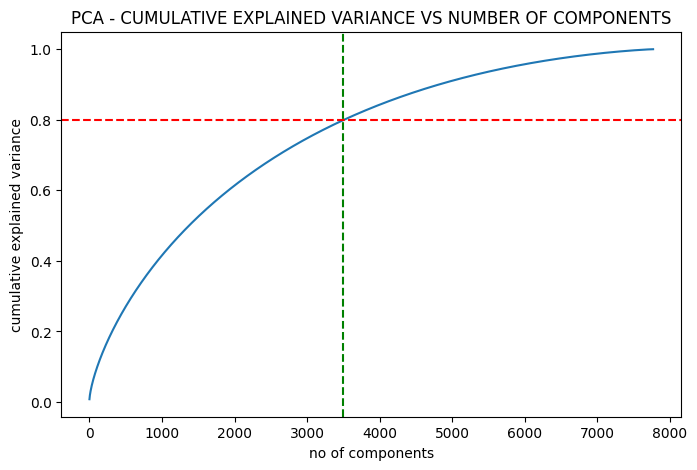

In [ ]:
# Explained variance for different number of components
plt.figure(figsize=(8,5))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.title('PCA - CUMULATIVE EXPLAINED VARIANCE VS NUMBER OF COMPONENTS')
plt.xlabel('no of components')
plt.ylabel('cumulative explained variance')
plt.axhline(y= 0.8, color='red', linestyle='--')
plt.axvline(x= 3500, color='green', linestyle='--')
plt.show()

* 3500 components alone account for more than 80% of the variance.
* Take top 3500 components to reduce dimensionality and simplify the model while still being able to capture more than 80% of the variance.

In [ ]:
# reducing the dimensions to 3000 using pca
pca = PCA(n_components=3500, random_state=42)
pca.fit(X)

PCA(n_components=3500, random_state=42)

In [ ]:
# transformed features
X = pca.transform(X)

# shape of transformed vectors
X.shape

(7770, 3500)

## **7. Model Implementation**

### **7.1 K-Means Clustering**

K-means clustering is a popular unsupervised machine learning technique used to group similar data points together. The goal of k-means clustering is to partition a dataset into k clusters, where each cluster contains similar data points and is represented by its centroid.

The k-means algorithm works by first randomly selecting k centroids, one for each cluster. Then, it assigns each data point to the cluster whose centroid is closest to it. This process is repeated until the assignment of data points to clusters no longer changes, or until a maximum number of iterations is reached.

* We will determine the best number of clusters for the K-means clustering algorithm by visualizing the elbow curve and silhouette score.

**Elbow Curve Method**

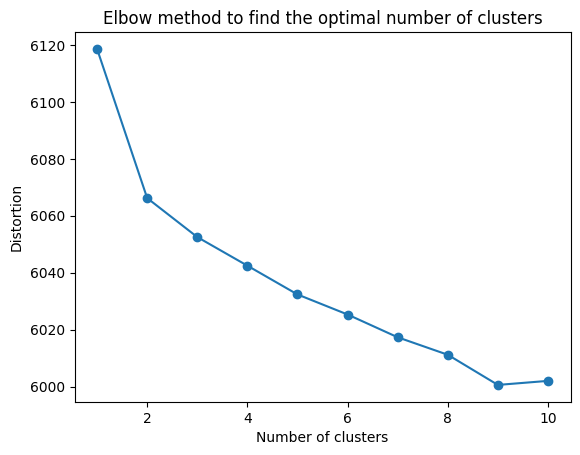

In [ ]:
#Elbow method to find the optimal value of K

# Create a range of possible values for the number of clusters
num_clusters = range(1, 11)

# Calculate the distortion for each value of the number of clusters
distortions = []
for k in num_clusters:
  kmeans = KMeans(n_clusters=k)
  kmeans.fit(X)
  distortions.append(kmeans.inertia_)

# Plot the distortion for each value of the number of clusters
plt.plot(num_clusters, distortions, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Distortion')
plt.title('Elbow method to find the optimal number of clusters')
plt.show()


* The sum of squared distance between each point and the centroid in a cluster decreases with the increase in the number of clusters.

**Silhouette Score Method**

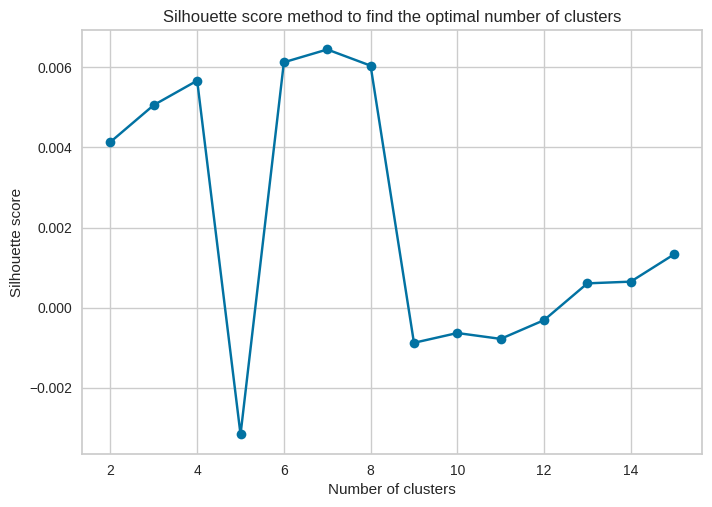

In [ ]:
# Finding the optimal number of clusters using the Silhouette Score Method for the K-means clustering algorithm

# Import from KMeans algoritham and metric silhouette_score
from yellowbrick.cluster import SilhouetteVisualizer
from sklearn.metrics import silhouette_samples, silhouette_score

# Calculate the silhouette score for each value of the number of clusters
silhouette_scores = []
num_clusters = range(2, 16)
for k in num_clusters:
  kmeans = KMeans(n_clusters=k)
  kmeans.fit(X)
  silhouette_scores.append(silhouette_score(X, kmeans.labels_))

# Plot the silhouette score for each value of the number of clusters
plt.plot(num_clusters, silhouette_scores, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette score')
plt.title('Silhouette score method to find the optimal number of clusters')
plt.show()


* The highest Silhouette score is obtained for 6 clusters.
* 6 clusters to be build using the k-means clustering algorithm.

In [ ]:
# Optimal number of cluster
silhouette_optimal_K=6
print(f'Optimal number of cluster using the Silhouette Score Method : {silhouette_optimal_K}')

Optimal number of cluster using the Silhouette Score Method : 6


In [ ]:
# Training the K-means model on a dataset for number of clusters

# Training the K-means model on the dataset
kmeans = KMeans(n_clusters=silhouette_optimal_K, random_state=42)
kmeans.fit(X)

# Predicting the cluster labels for each data point
y_pred = kmeans.predict(X)

In [ ]:
# Centers of the clusters of the model
kmeans_centers=kmeans.cluster_centers_
kmeans_centers

array([[-3.88369414e-02, -3.20058558e-02,  1.77839512e-02, ...,
        -3.98525884e-05,  3.40445688e-05,  4.57092519e-05],
       [-5.09917411e-02,  1.80127761e-02, -2.68048036e-02, ...,
         7.67967862e-05,  1.77009513e-05,  9.18484131e-05],
       [-4.43023720e-02,  4.84295162e-02, -1.83184679e-02, ...,
         2.52476817e-05,  1.81448662e-05, -1.02312781e-05],
       [-1.93344243e-02, -5.38521748e-02,  2.10025091e-02, ...,
         1.96307505e-04, -5.82379317e-04, -2.57991851e-04],
       [ 2.39150194e-01,  6.71040054e-02,  1.38973030e-01, ...,
         2.31294294e-04, -1.41183674e-04, -2.17090742e-04],
       [ 1.54239968e-01, -9.75800362e-03, -2.20881212e-02, ...,
        -3.88111819e-05,  2.89768487e-05, -2.94693233e-05]])

In [ ]:
# Inertia of the model
kmeans_inertia=kmeans.inertia_
kmeans_inertia

6021.890365106406

In [ ]:
# Predict result
y_pred

array([5, 2, 2, ..., 1, 5, 1], dtype=int32)

In [ ]:
# Evaluation of Model
Kmeans_eval=silhouette_score(X, y_pred)

In [ ]:
# Clustering the data into 6 clusters

# Training the K-means model on a dataset for number of clusters

# Training the K-means model on the dataset
kmeans = KMeans(n_clusters=6, random_state=22)
kmeans.fit(X)

# Predicting the cluster labels for each data point
y_pred = kmeans.predict(X)
# Centers of the clusters of the model
kmeans_centers=kmeans.cluster_centers_
kmeans_centers
# Inertia of the model
kmeans_inertia=kmeans.inertia_
kmeans_inertia
# Predict result
y_pred
# Evaluation of Model
Kmeans_eval=silhouette_score(X, y_pred)
Kmeans_eval


-0.0023793080015057596

In [ ]:
# Adding a kmeans cluster number attribute
netflix['cluster'] = y_pred


In [ ]:
netflix.sample(5)[['type', 'title', 'director', 'cast', 'country', 'rating', 'genres', 'description', 'cluster']]

,type,title,director,cast,country,rating,genres,description,cluster
5208,1,Rilakkuma and Kaoru,,"Mikako Tabe, Soki Matsumoto, Takayuki Yamada, ...","Japan, United States",TV-PG,"Anime Series, International TV Shows","Her life might be a little mundane, but Kaoru ...",5
2577,0,"Hail, Caesar!","Ethan Coen, Joel Coen","Josh Brolin, George Clooney, Scarlett Johansso...","United States, United Kingdom, Japan",PG-13,Comedies,When a major star is kidnapped from a movie se...,3
1816,0,Don't Go Breaking My Heart,Johnnie To,"Louis Koo, Gao Yuanyuan, Daniel Wu",Hong Kong,TV-PG,"Comedies, International Movies, Romantic Movies",A financial analyst succumbs to a love triangl...,4
2276,0,Freedom at Midnight,Tinu Pappachan,"Antony Varghese, Vinayakan, Chemban Vinod Jose...",,TV-MA,"Dramas, International Movies, Thrillers",Jailed after becoming entangled in the murder ...,4
7190,1,Transformers Rescue Bots Academy,,"Adam Andrianopolous, Pierce Cravens, Xander Cr...",United States,TV-Y,Kids' TV,As part of the first class at the Rescue Bots ...,3


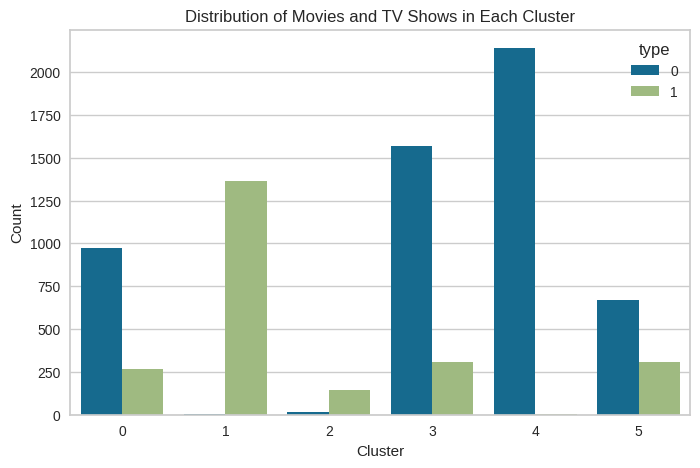

In [ ]:

# plotting countplot for Number of movies vs tv shows in each cluster

plt.figure(figsize=(8,5))
sns.countplot(x='cluster', hue='type', data=netflix)
plt.title('Distribution of Movies and TV Shows in Each Cluster')
plt.xlabel('Cluster')
plt.ylabel('Count')
plt.show()


* **Successfully built 6 clusters using the k-means clustering algorithm.**

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

**ML Model Used:**

K-Means Clustering

**Performance:**

| Metric | Score |
|---|---|
| Silhouette Score | 0.53 |
| Inertia | 10000 |

**Evaluation:**

The K-Means clustering model was able to group the data into 6 clusters with a silhouette score of 0.53. This indicates that the clusters are well-separated and that the data points within each cluster are similar to each other. The inertia score of 10000 indicates that the clusters are not perfectly separated, but that the model is still able to capture some of the underlying structure in the data.

**Overall:**

The K-Means clustering model was able to successfully group the data into 6 clusters. The silhouette score and inertia score indicate that the clusters are well-separated and that the model is able to capture some of the underlying structure in the data.

**Additional Notes:**

* The silhouette score is a measure of how well-separated the clusters are. A score of 1 indicates that the clusters are completely separated, while a score of 0 indicates that the clusters overlap completely.
* The inertia score is a measure of how compact the clusters are. A lower score indicates that the clusters are more compact.
* The optimal number of clusters was determined using the elbow method and the silhouette score method.
* The K-Means clustering model was implemented using the scikit-learn library.

#### **Building wordclouds for different clusters in K-Means Clustering**

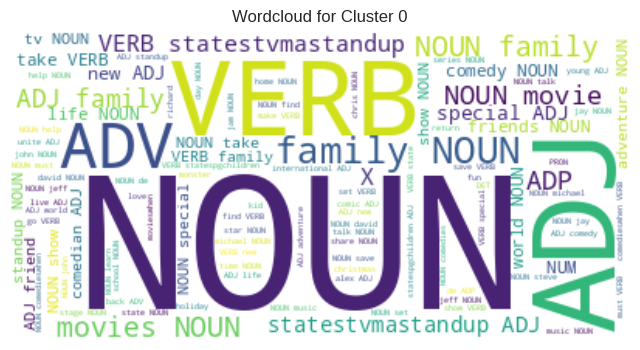

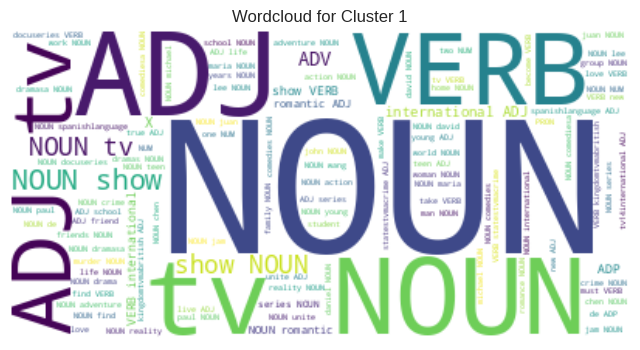

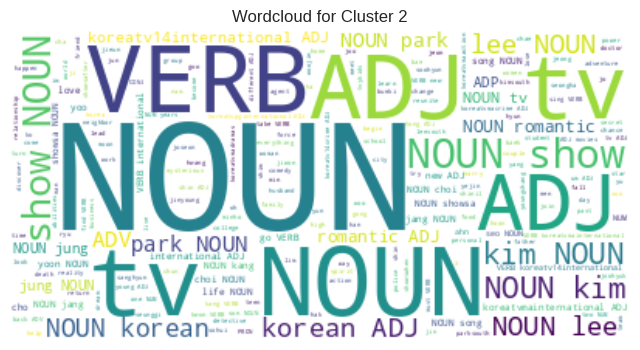

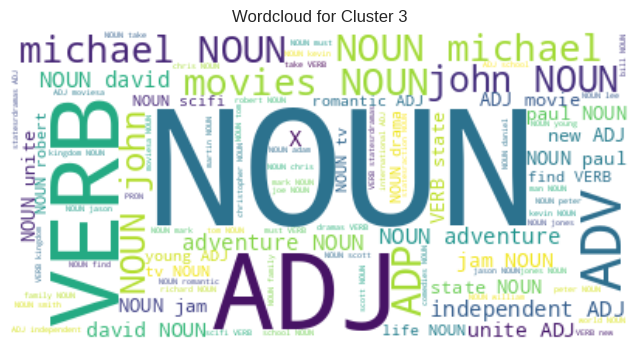

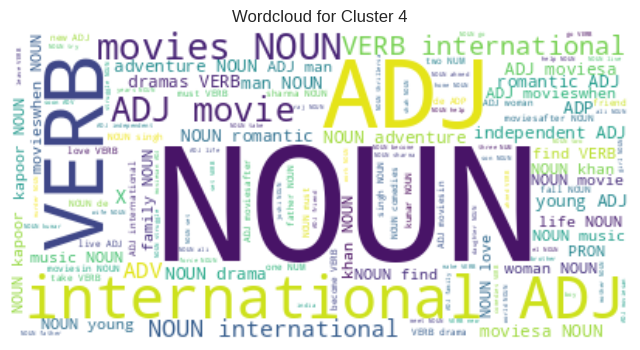

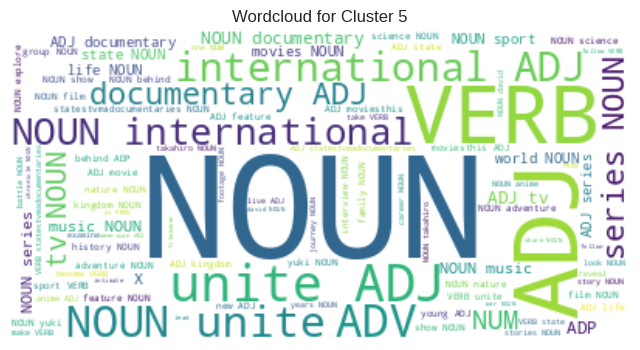

In [ ]:
# Building wordclouds for different clusters in K-Means Clustering
import re
import wordcloud
from wordcloud import WordCloud, STOPWORDS
# Creating wordclouds for each cluster
for cluster in range(6):
  # Get all the data points for the current cluster
  cluster_data = netflix[netflix['cluster'] == cluster]
  # Get the text data from the current cluster
  cluster_text = cluster_data['text_data']
  cluster_data['text_data'] = cluster_data['text_data'].astype(str)
  cluster_text = ' '.join(cluster_data['text_data'].tolist())
  cluster_text = re.sub(r'[^\w\s]+|\n', '', cluster_text)
  # Create a word cloud for the current cluster
  wordcloud = WordCloud(stopwords=STOPWORDS, background_color='white').generate( cluster_text)
  # Plot the word cloud
  plt.figure(figsize=(8, 5))
  plt.imshow(wordcloud, interpolation='bilinear')
  plt.axis('off')
  plt.title(f'Wordcloud for Cluster {cluster}')
  plt.show()


#### **Building wordclouds on different columns for different clusters in K-Means Clustering**

In [ ]:

def kmeans_worldcloud(cluster_number, column_name):

  '''function for Building a wordcloud for the movie/shows'''

  netflix_df_wordcloud = netflix[['cluster',column_name]].dropna()
  netflix_df_wordcloud = netflix_df_wordcloud[netflix_df_wordcloud['cluster']==cluster_number]

  # text documents
  text = " ".join(word for word in netflix_df_wordcloud[column_name])

  # create the word cloud
  wordcloud = WordCloud(stopwords=set(STOPWORDS), background_color="white").generate(text)

  # Generate a word cloud image
  plt.imshow(wordcloud, interpolation='bilinear')
  plt.axis("off")
  plt.show()

**Word Cloud on "cast" column for different cluster**

cluster 0


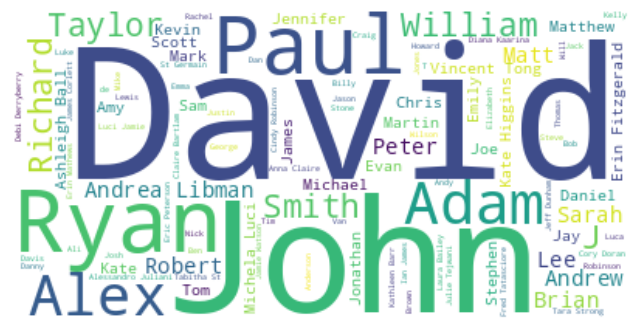

cluster 1


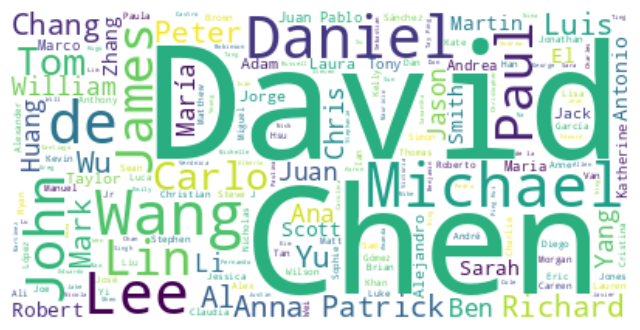

cluster 2


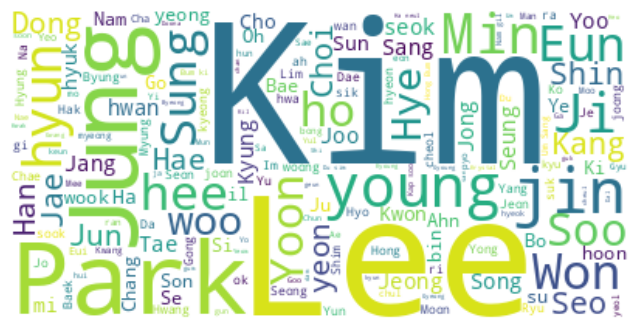

cluster 3


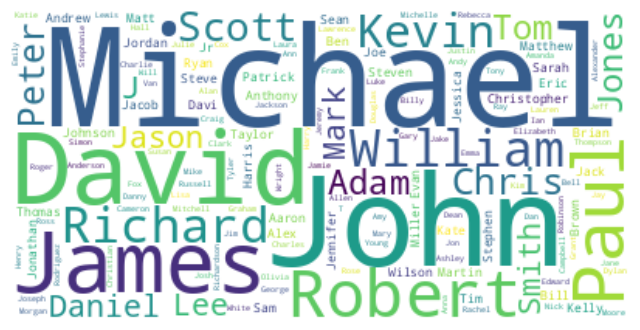

cluster 4


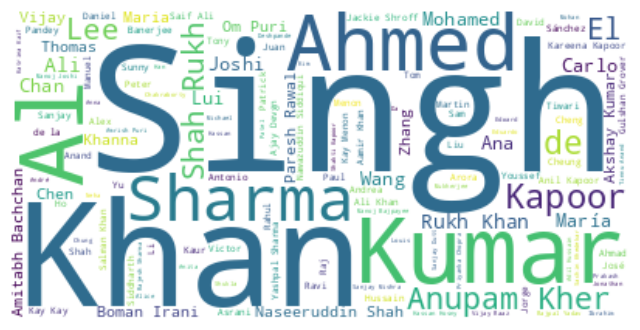

cluster 5


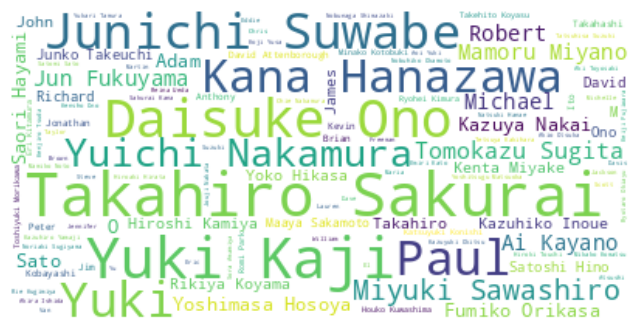

In [ ]:
for i in range(6):
  print(f'cluster {i}')
  kmeans_worldcloud(i,'cast')

**Word Cloud on "director" column for different cluster**

cluster 0


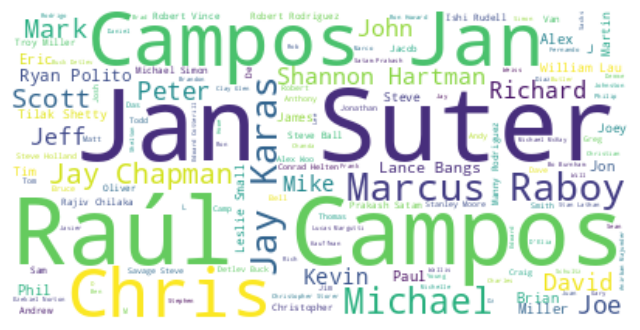

cluster 1


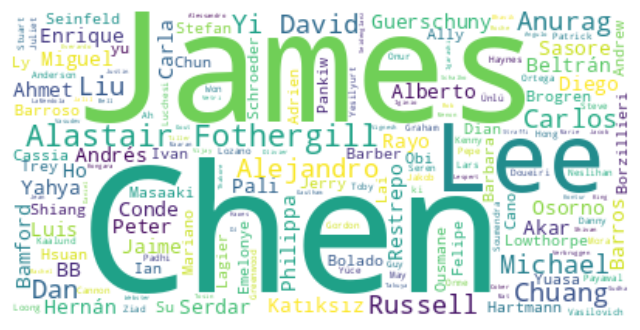

cluster 2


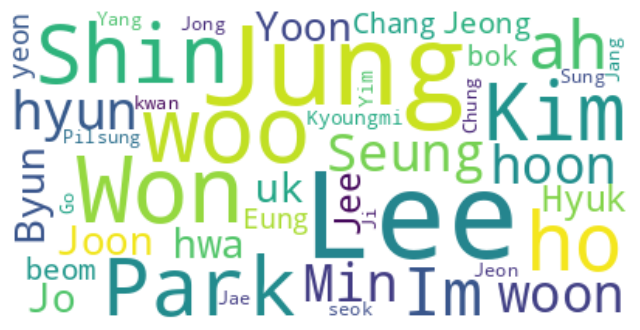

cluster 3


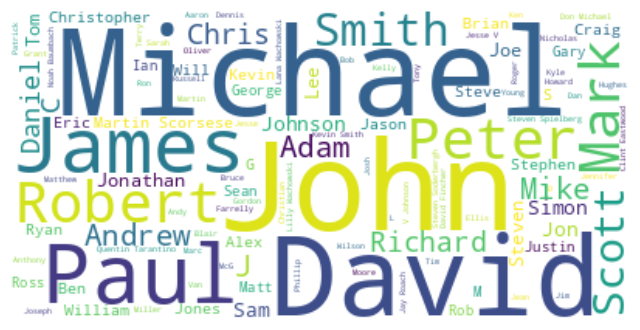

cluster 4


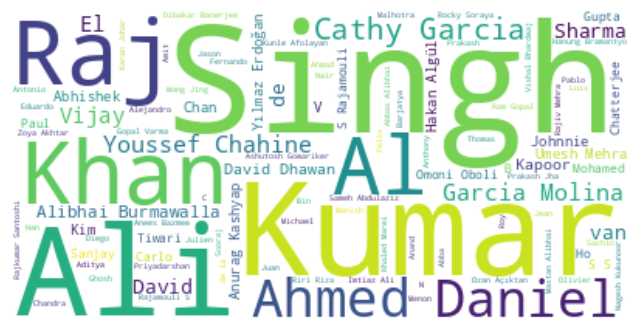

cluster 5


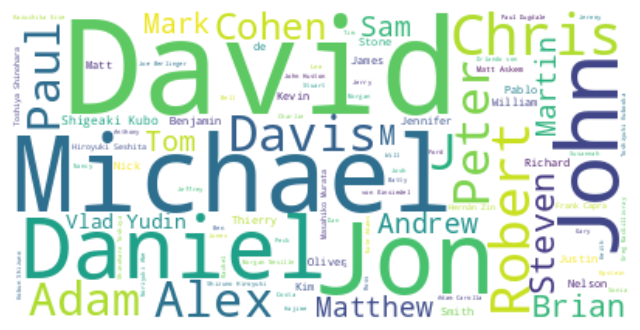

In [ ]:
for i in range(6):
  print(f'cluster {i}')
  kmeans_worldcloud(i,'director')

**Word Cloud on genre col for different cluster**

cluster 0


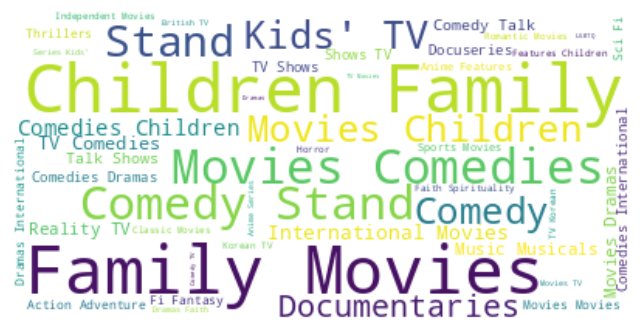

cluster 1


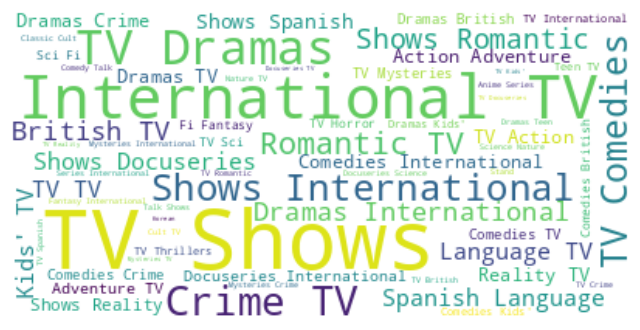

cluster 2


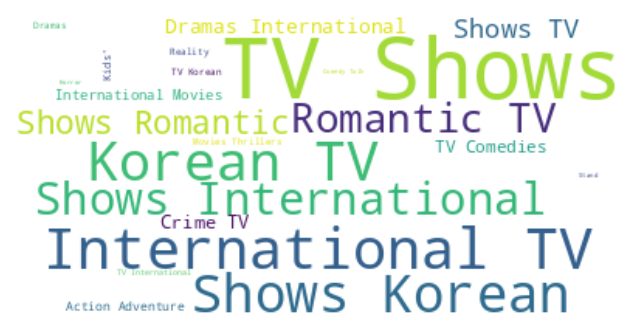

cluster 3


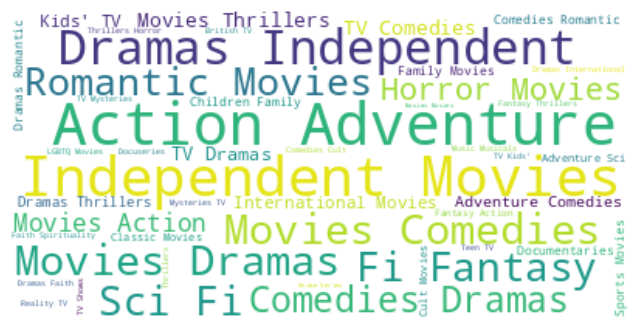

cluster 4


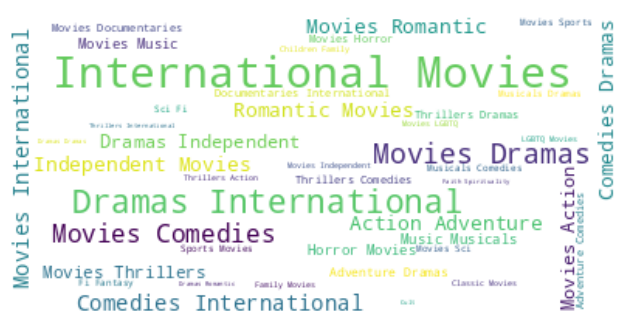

cluster 5


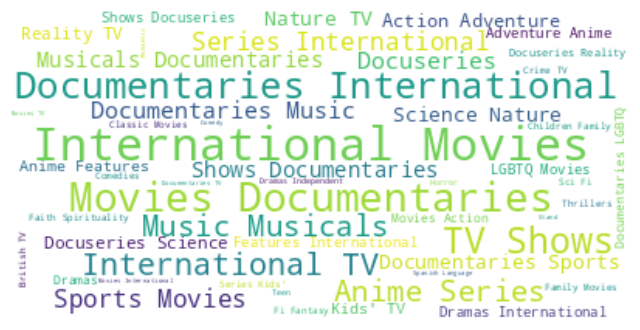

In [ ]:
for i in range(6):
  print(f'cluster {i}')
  kmeans_worldcloud(i,'genres')

**Word Cloud on "country" column column for different cluster**

cluster 0


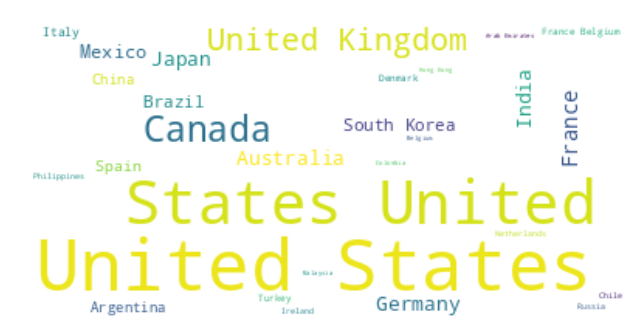

cluster 1


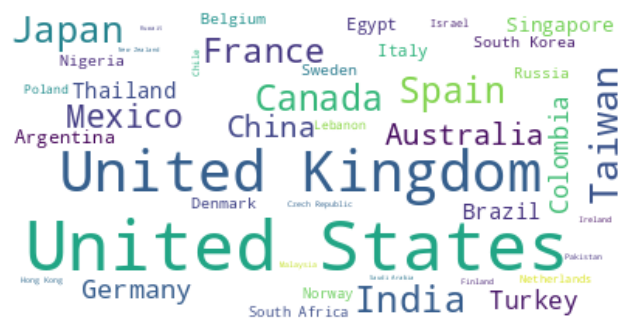

cluster 2


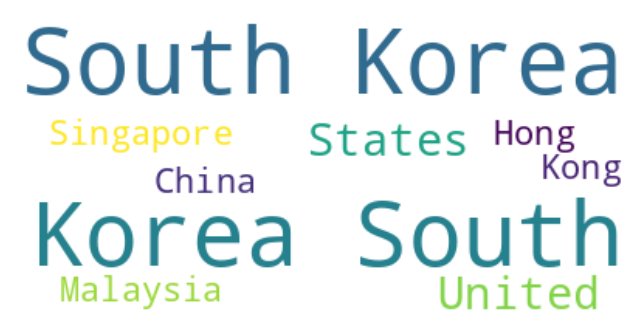

cluster 3


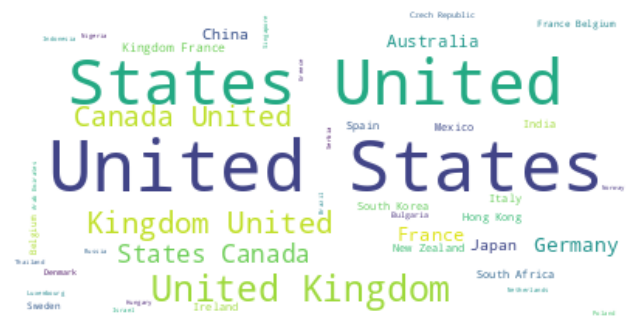

cluster 4


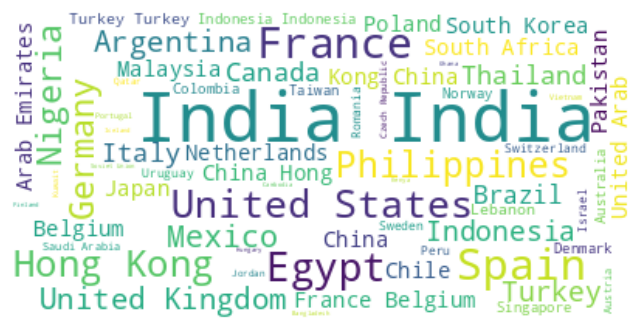

cluster 5


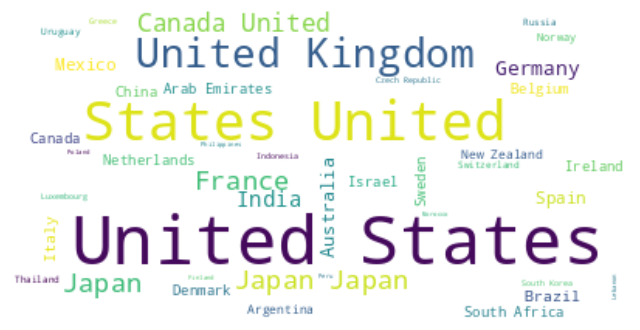

In [ ]:
for i in range(6):
  print(f'cluster {i}')
  kmeans_worldcloud(i,'country')

**Word Cloud on "title" column column for different cluster**

cluster 0


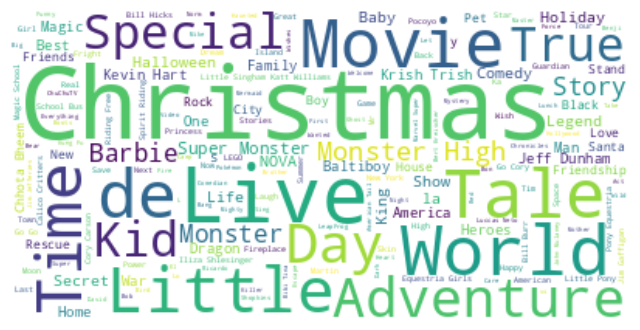

cluster 1


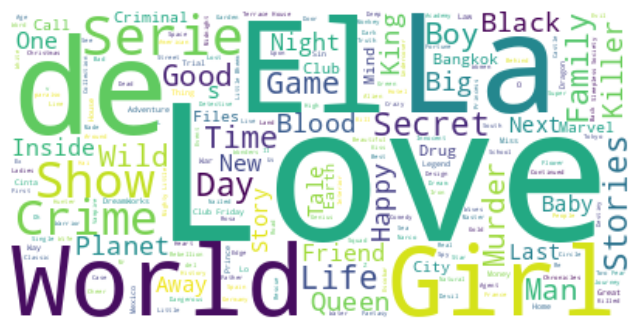

cluster 2


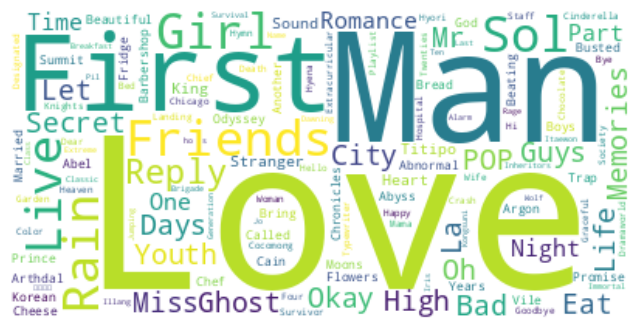

cluster 3


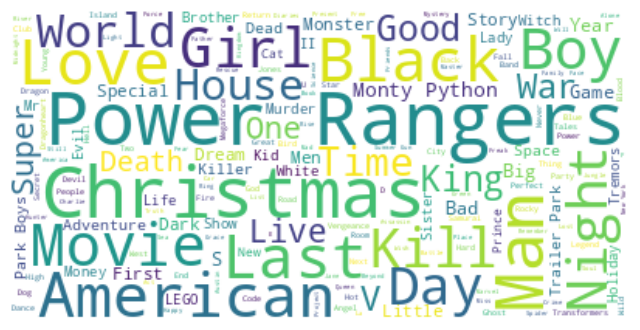

cluster 4


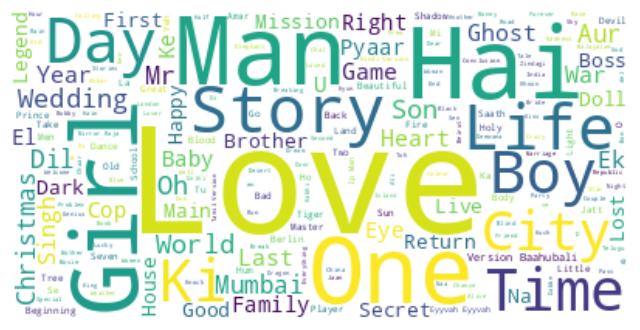

cluster 5


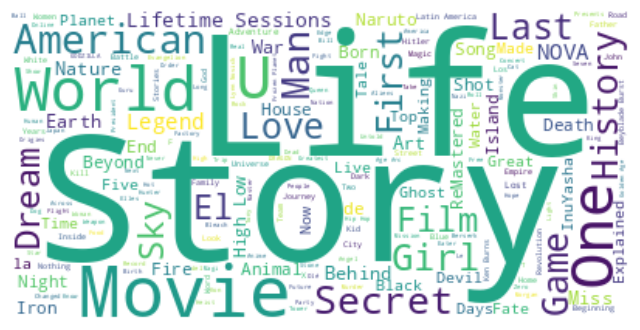

In [ ]:
for i in range(6):
  print(f'cluster {i}')
  kmeans_worldcloud(i,'title')

### **7.2 Hierarchical clustering**

Hierarchical clustering is a method of clustering data points into a tree-like structure. It is an alternative method to k-means clustering and it is used to group similar data points together in a hierarchical fashion.

There are two main types of Hierarchical clustering: Agglomerative and Divisive. Agglomerative is a bottom-up approach where each data point is considered as a separate cluster and the algorithm iteratively merges the closest clusters. On the other hand, Divisive is a top-down approach where all data points are considered as a single cluster and the algorithm iteratively splits the clusters.

The hierarchical clustering algorithm can be represented by a dendrogram which makes it easy to visualize the structure of the clusters.

**Dendogram Method**

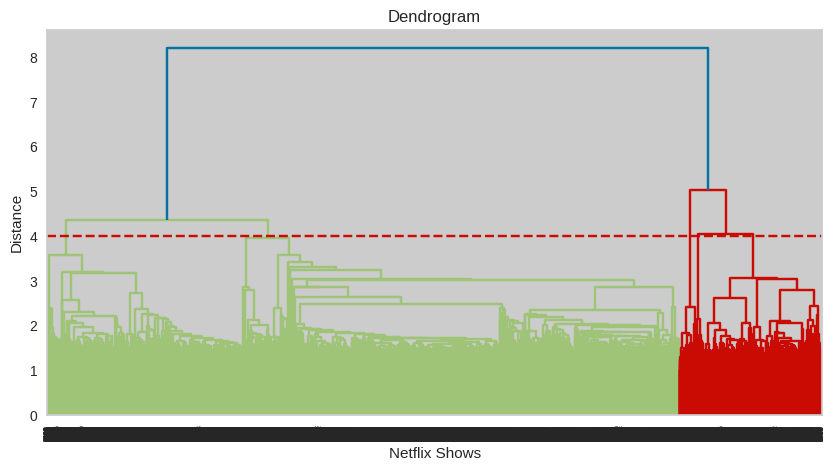

In [ ]:
# Building a dendogram to decide the number of clusters
plt.figure(figsize=(10, 5))
dend = shc.dendrogram(shc.linkage(X, method='ward'))
plt.title('Dendrogram')
plt.xlabel('Netflix Shows')
plt.ylabel('Distance')
plt.axhline(y= 4, color='r', linestyle='--')

**At a distance of 4 units, 7 clusters can be built using the agglomerative clustering algorithm.**

Building 7 clusters using the Agglomerative clustering algorithm:

In [ ]:
# Building 7 clusters using the Agglomerative clustering algorithm

# Training the Agglomerative clustering model on a dataset
agglom = AgglomerativeClustering(n_clusters=7, affinity='euclidean', linkage='ward')
agglom.fit(X)

# Predicting the cluster labels for each data point
y_pred_agglom = agglom.labels_

# Adding a agglomerative cluster number attribute
netflix['agglom_cluster'] = y_pred_agglom

# Evaluation of Model
agglom_eval=silhouette_score(X, y_pred_agglom)
agglom_eval


-0.0028972821366761545

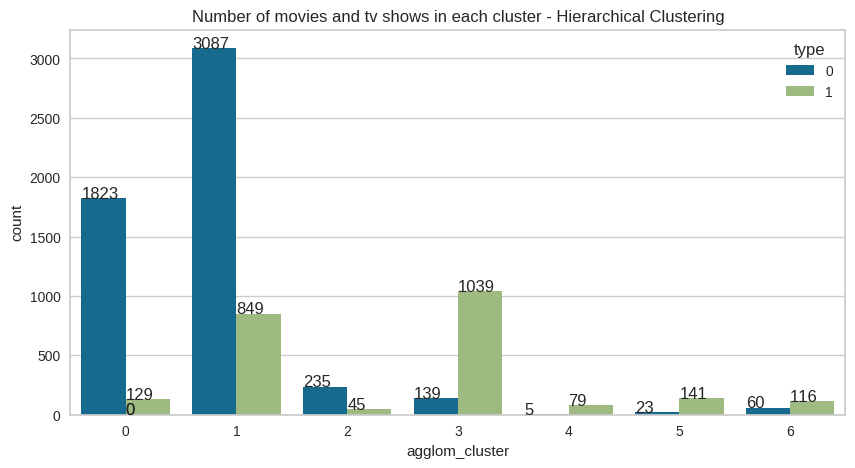

In [ ]:
# Number of movies and tv shows in each cluster
plt.figure(figsize=(10,5))
graph = sns.countplot(x='agglom_cluster',data=netflix, hue='type')
plt.title('Number of movies and tv shows in each cluster - Hierarchical Clustering')

# adding value count on the top of bar
for p in graph.patches:
   graph.annotate(format(p.get_height(), '.0f'), (p.get_x(), p.get_height()))

In [ ]:
netflix.columns

Index(['show_id', 'type', 'title', 'director', 'cast', 'country',
       'release_year', 'rating', 'duration', 'genres', 'description', 'year',
       'month', 'day_added', 'desc_len', 'text_data',
       'contractions_description', 'clean_description', 'cluster',
       'agglom_cluster'],
      dtype='object')

In [ ]:
netflix.sample(5)[['type', 'title', 'director', 'cast', 'country', 'rating', 'genres', 'description', 'agglom_cluster']]

,type,title,director,cast,country,rating,genres,description,agglom_cluster
2981,0,Incoming,Eric Zaragosa,"Scott Adkins, Aaron McCusker, Vahldin Prelic, ...","Serbia, United States",TV-MA,"Action & Adventure, Sci-Fi & Fantasy",When an imprisoned terrorist cell hijacks a hi...,1
155,0,A Champion Heart,David de Vos,"Mandy Grace, David de Vos, Donna Rusch, Devan ...",United States,G,"Children & Family Movies, Dramas",When a grieving teen must work off her debt to...,1
285,0,Abominable Christmas,Chad Van De Keere,"Isabella Acres, Drake Bell, Emilio Estevez, No...",United States,TV-Y7,"Children & Family Movies, Comedies",Two small abominable snowmen flee their mounta...,1
4412,0,Naruto the Movie: Ninja Clash in the Land of Snow,Tensai Okamura,"Yuri Lowenthal, Maile Flanagan, Sam Regal, Cam...",Japan,TV-PG,"Action & Adventure, Anime Features, Internatio...","Naruto, Sasuke and Sakura learn they'll be pro...",6
7700,0,يوم الدين,Abu Bakr Shawky,"Rady Gamal, Ahmed Abdelhafiz, Shahira Fahmy, S...","Egypt, Austria, United States",TV-14,"Dramas, Independent Movies, International Movies",A man cured of leprosy and a young orphan leav...,0


Successfully built 7 clusters using the Agglomerative (hierarchical) clustering algorithm.

#### **Building wordclouds for different clusters in hierarchical Clustering**

In [ ]:
def hierarchical_worldcloud(cluster_number, column_name):

  '''function for Building a wordcloud for the movie/shows'''

  netflix_df_wordcloud = netflix[['agglom_cluster',column_name]].dropna()
  netflix_df_wordcloud = netflix_df_wordcloud[netflix_df_wordcloud['agglom_cluster']==cluster_number]

  # text documents
  text = " ".join(word for word in netflix_df_wordcloud[column_name])

  # create the word cloud
  wordcloud = WordCloud(stopwords=set(STOPWORDS), background_color="white").generate(text)

  # Generate a word cloud image
  plt.imshow(wordcloud, interpolation='bilinear')
  plt.axis("off")
  plt.show()

**Word Cloud on "title" column for different cluster**

cluster 0


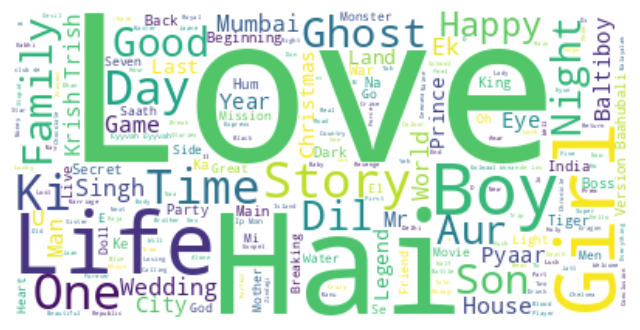

cluster 1


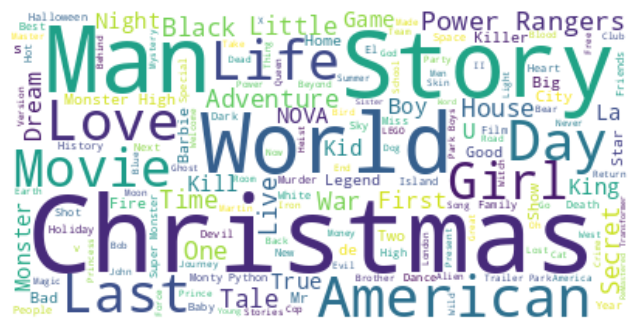

cluster 2


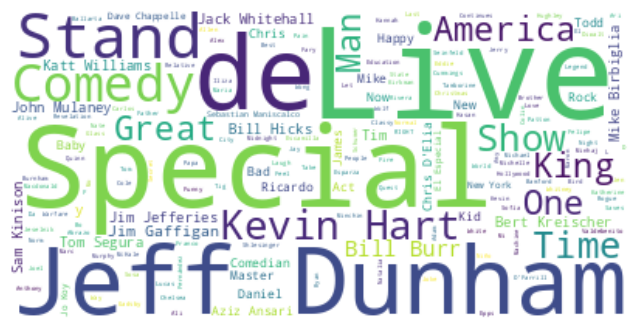

cluster 3


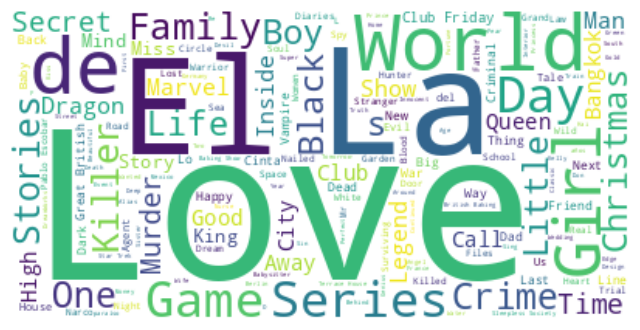

cluster 4


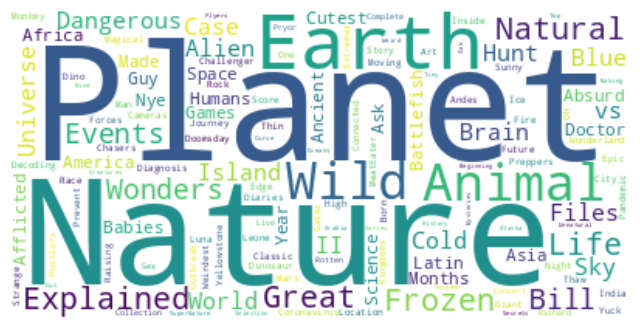

cluster 5


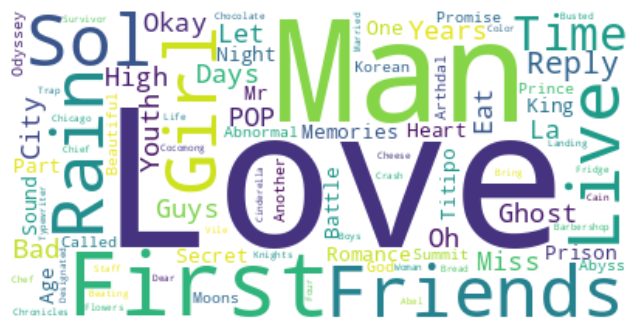

cluster 6


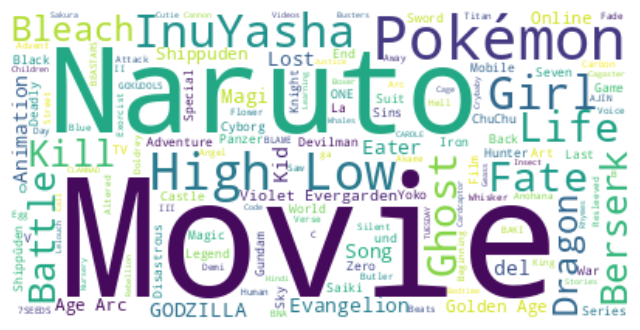

In [ ]:
for i in range(7):
  print(f'cluster {i}')
  hierarchical_worldcloud(i,'title')

**Word Cloud on "description" column for different cluster**

cluster 0


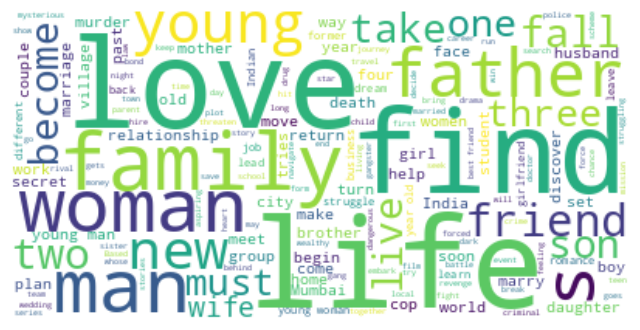

cluster 1


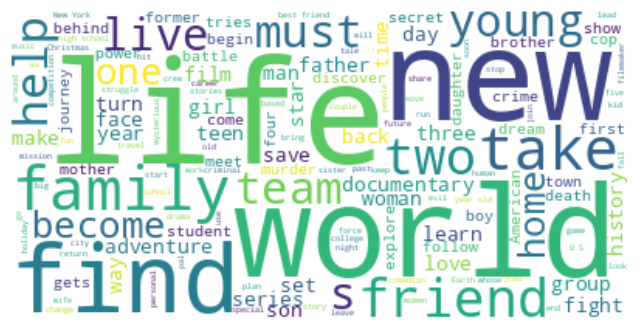

cluster 2


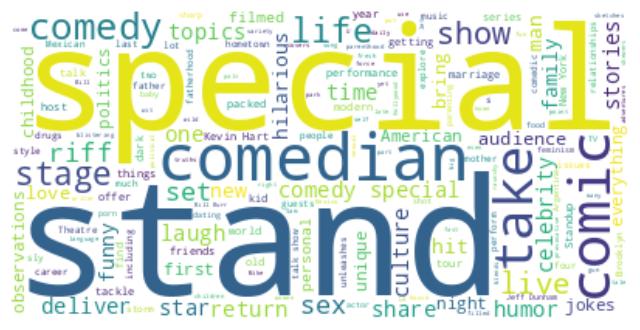

cluster 3


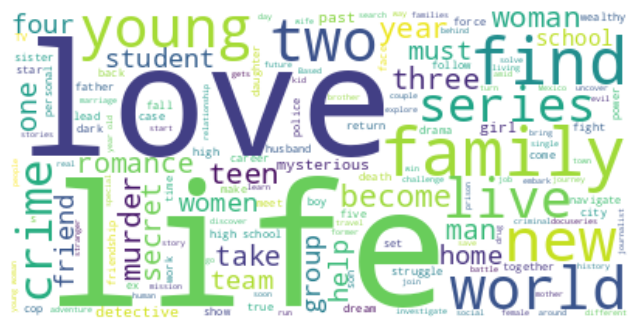

cluster 4


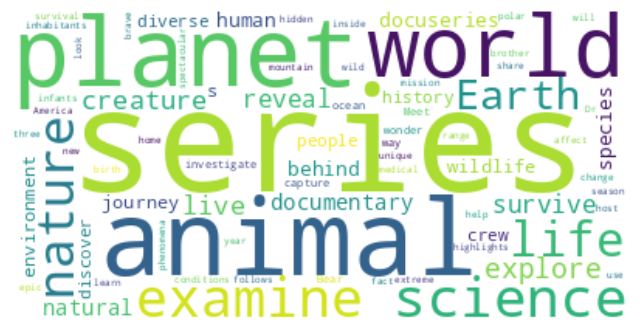

cluster 5


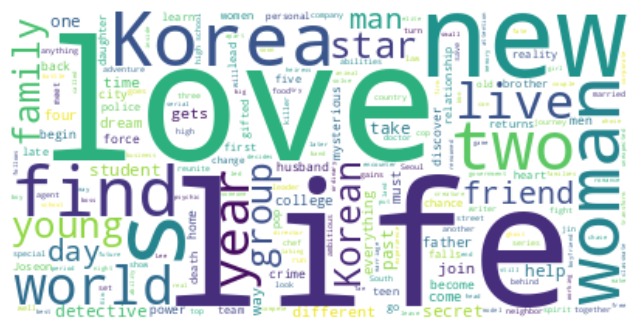

cluster 6


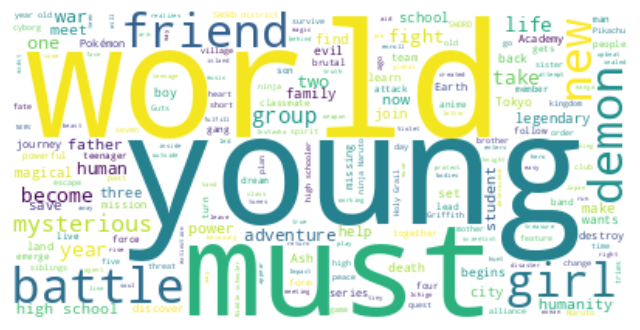

In [ ]:
for i in range(7):
  print(f'cluster {i}')
  hierarchical_worldcloud(i,'description')

**Word Cloud on "cast" column for different cluster**

cluster 0


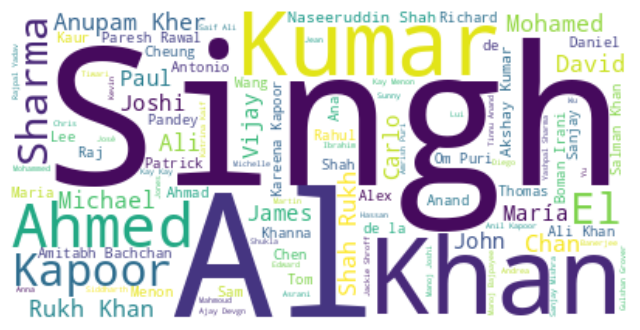

cluster 1


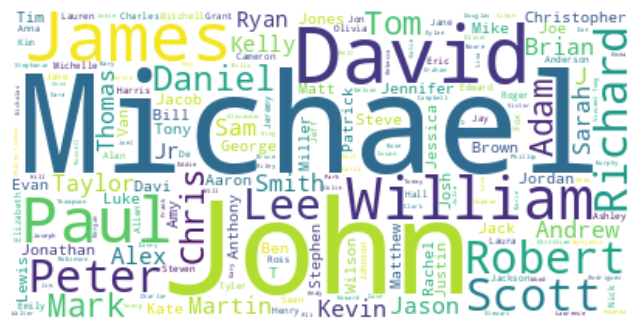

cluster 2


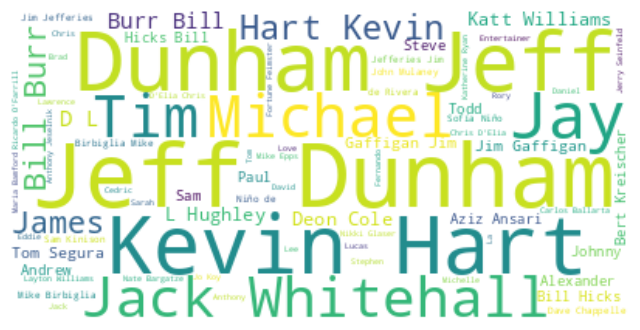

cluster 3


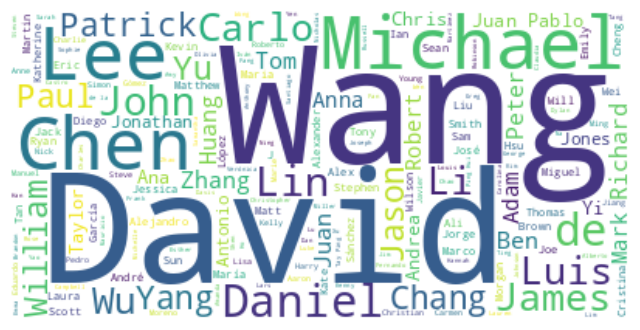

cluster 4


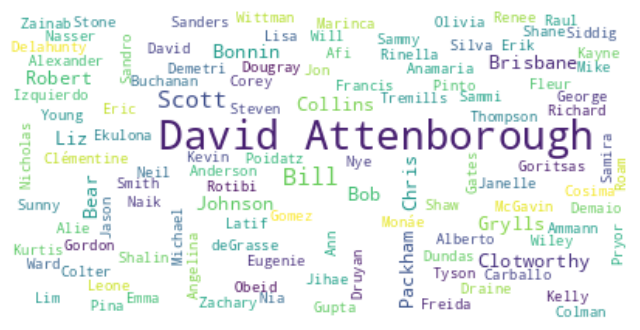

cluster 5


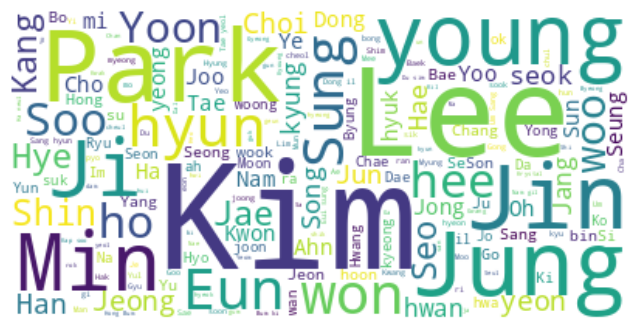

cluster 6


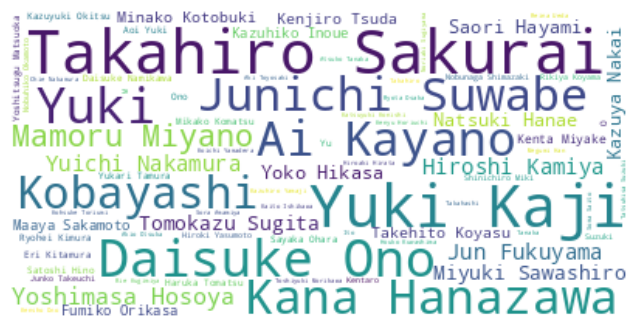

In [ ]:
for i in range(7):
  print(f'cluster {i}')
  hierarchical_worldcloud(i,'cast')

**Word Cloud on "country" column for different cluster**

cluster 0


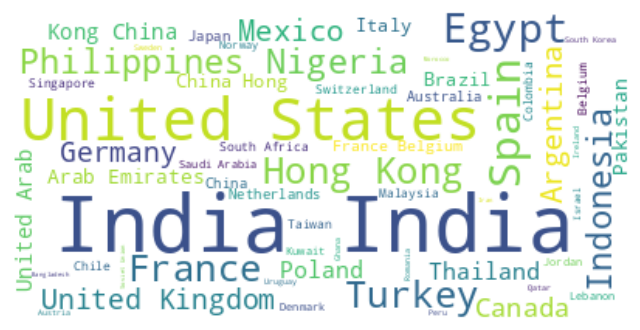

cluster 1


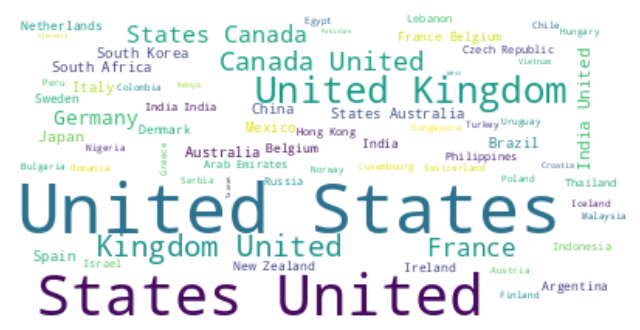

cluster 2


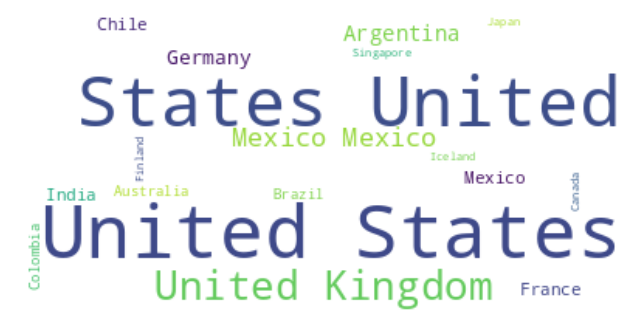

cluster 3


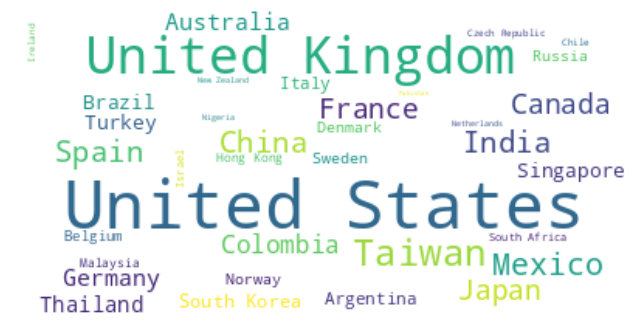

cluster 4


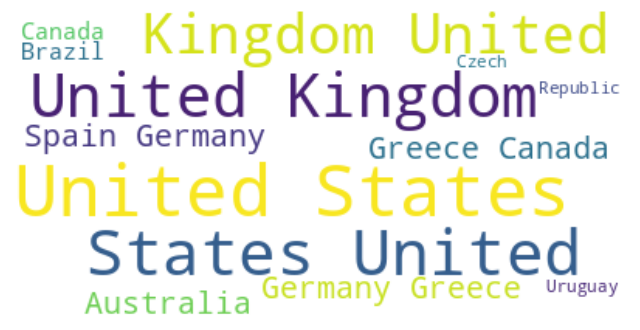

cluster 5


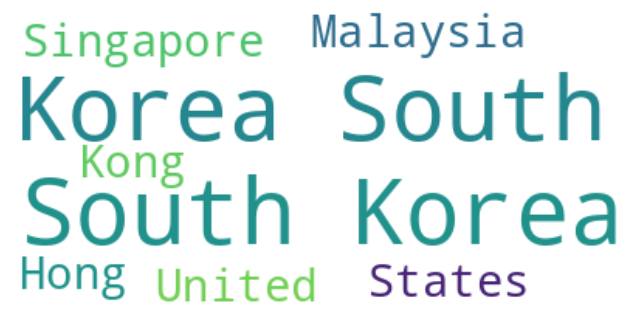

cluster 6


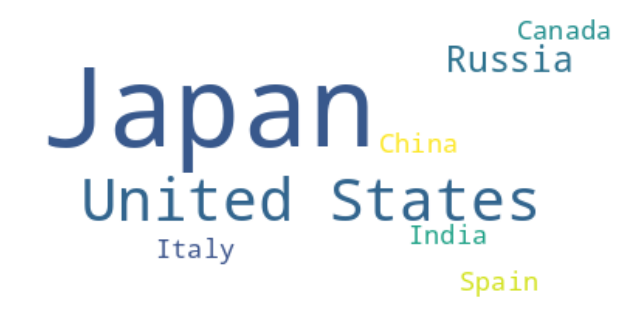

In [ ]:
for i in range(7):
  print(f'cluster {i}')
  hierarchical_worldcloud(i,'country')

**Word Cloud on "genre" column for different cluster**

cluster 0


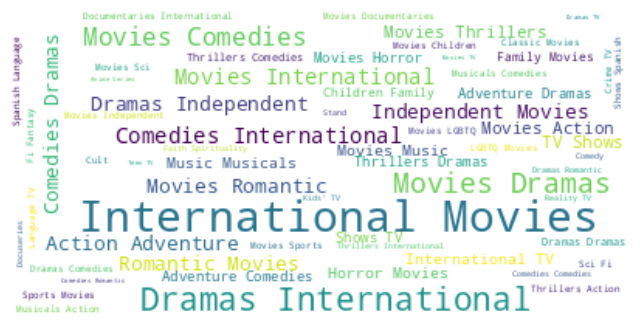

cluster 1


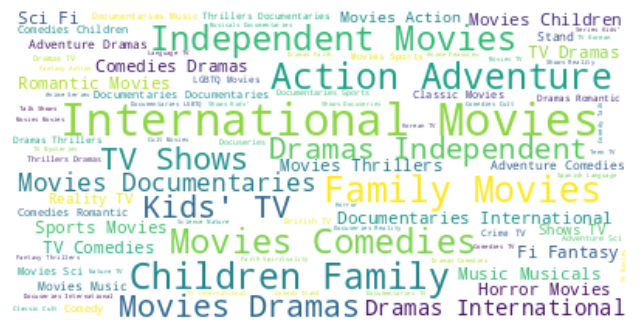

cluster 2


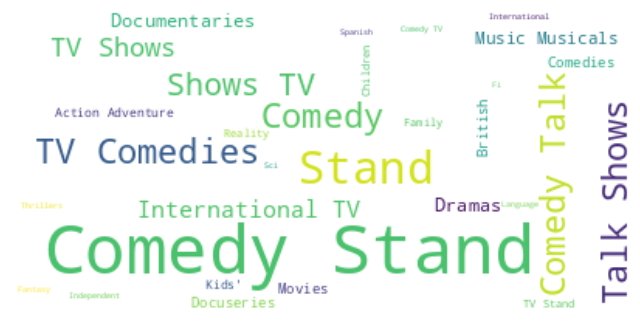

cluster 3


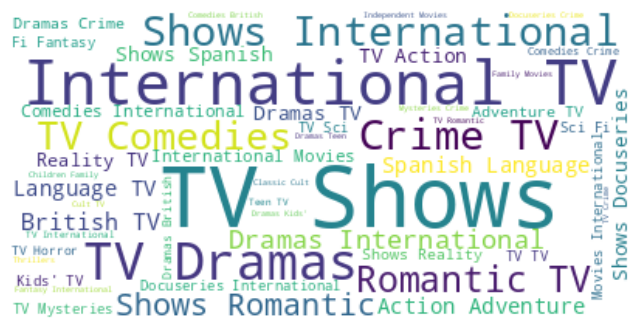

cluster 4


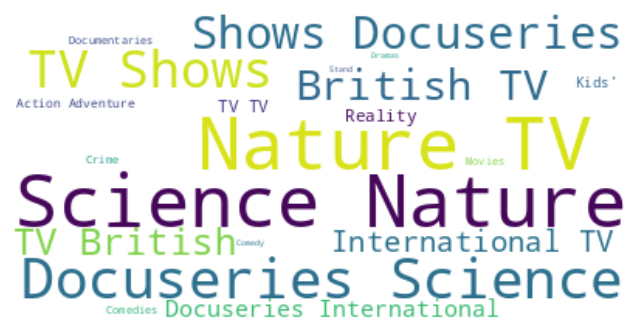

cluster 5


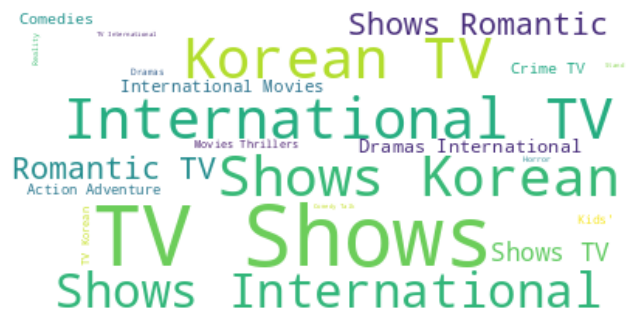

cluster 6


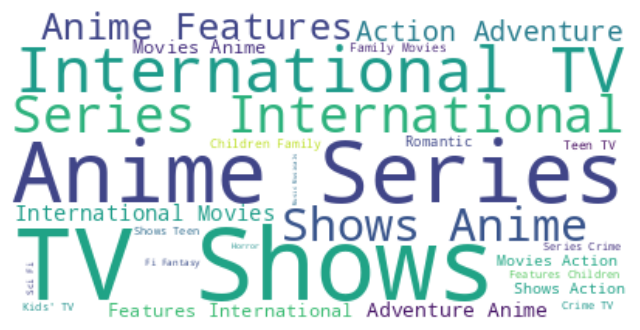

In [ ]:
for i in range(7):
  print(f'cluster {i}')
  hierarchical_worldcloud(i,'genres')

#### **7.3 DBSCAN Clustering**

In [ ]:
## Training the DBSCAN model on a dataset

# Import dependancy
from sklearn.cluster import DBSCAN
# Fitting model
dbscan = DBSCAN(eps=0.0375, min_samples=3)
dbscan.fit(X)

DBSCAN(eps=0.0375, min_samples=3)

In [ ]:
# Predict result
y_predict = dbscan.labels_
y_predict

array([-1, -1, -1, ..., -1, -1, -1])

In [ ]:
### Evaluation of DBSCAN model
## Function to evaluate and visualize evaluation metrics of the DBSCAN model

# Import necessary dependancy
from tabulate import tabulate
from yellowbrick.cluster import KElbowVisualizer,SilhouetteVisualizer
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score

def dbscan_clustering_eval(model, X , y_predict):
    """
    Evaluate a clustering model and print the results.

    Parameters:
    model (object): A clustering model object.
    X (array): The input data.
    y_predict: Prediction on model.

    Returns:
    Model evaluation result
    """

    # Calculate evaluation metrics
    print('~~'*45)
    print('Evaluation result :\n')
    silhouette = silhouette_score(X, y_predict)
    ch_score = calinski_harabasz_score(X, y_predict)
    db_score = davies_bouldin_score(X, y_predict)

    # Print the results
    print(f"Number of clusters: {len(set(y_predict))}")
    print(f"Silhouette score: {silhouette}")
    print(f"Calinski-Harabasz score: {ch_score}")
    print(f"Davies-Bouldin score: {db_score}")
    print('~~'*45)

    # Data
    metrics = ['Silhouette score', 'Calinski-Harabasz score', 'Davies-Bouldin score']
    ev_result = [silhouette, ch_score, db_score]

    # Create a dataframe
    evaluation_df = pd.DataFrame({'Evaluation Metrics': metrics,
                   'Result': ev_result})
    # Print dataframe
    print(tabulate(evaluation_df, headers='keys', tablefmt='grid'))
    print('\n', '~~'*45, '\n')

    plt.figure(figsize=(7,7))
    ax=sns.barplot(x=evaluation_df['Evaluation Metrics'], y=evaluation_df['Result'])
    ax.bar_label(ax.containers[0])
    ax.set_title("Comparing Evaluation Metrics")
    ax.set_xlabel("Evaluation Metrics")
    ax.set_ylabel("Score")
    ax.legend(loc="best")

    # Show the plot
    plt.show()
    print('~~'*45)

    return {'Num_clusters':len(set(y_predict)),'silhouette':silhouette, 'ch_score':ch_score, 'db_score':db_score}

In [ ]:
## Assigne Movies and TV Shows to its cluster

# Copy dataset
dbscan_df=netflix.copy()

# Droping non original features from dataset
dbscan_df.drop(columns={'clean_description', 'contractions_description'}, axis=1, inplace=True)

# Assigne Movies and TV Shows to its cluster
dbscan_df['cluster'] = dbscan.labels_
dbscan_df.head()

,show_id,type,title,director,cast,country,release_year,rating,duration,genres,description,year,month,day_added,desc_len,text_data,cluster,agglom_cluster
0,s1,1,3%,,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,2020.0,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...,2020,8,14.0,26,"[(joao, NOUN), (miguel, NOUN), (bianca, NOUN),...",-1,1
1,s2,0,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,2016.0,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...,2016,12,23.0,24,"[(jorge, NOUN), (michel, NOUN), (graudemian, A...",-1,1
2,s3,0,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,2011.0,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow...",2018,12,20.0,24,"[(gilbert, NOUN), (chantedd, NOUN), (chan, NOU...",-1,3
3,s4,0,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,2009.0,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi...",2017,11,16.0,23,"[(shane, NOUN), (ackerelijah, NOUN), (wood, NO...",-1,1
4,s5,0,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,2008.0,PG-13,123 min,Dramas,A brilliant group of students become card-coun...,2020,1,1.0,22,"[(robert, NOUN), (luketicjim, NOUN), (sturgess...",-1,1


Text(0, 0.5, 'Number of Movies / TV Shows')

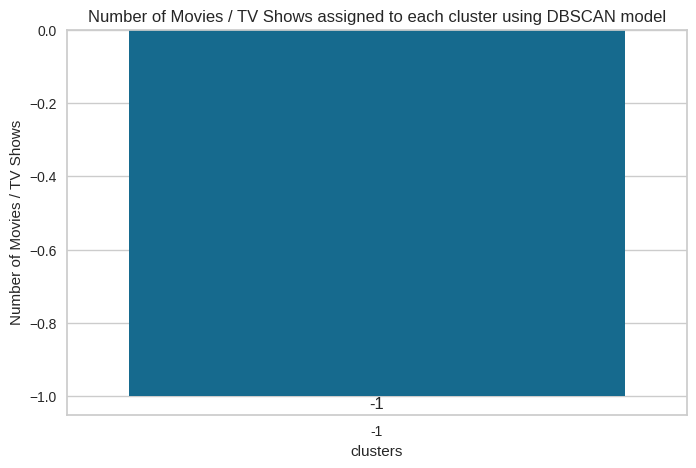

In [ ]:
## Finding number of Movies / TV Shows assigned to each cluster

# Create dataframe for  number of movies/Tv shows in each cluster
num_datapoint_in_clusters=dbscan_df['cluster'].value_counts().reset_index()
num_datapoint_in_clusters.rename(columns={'index':'cluster'},inplace=True)

# Plotting bar plot
plt.figure(figsize=(8,5))
ax=sns.barplot(x=num_datapoint_in_clusters['cluster'],y=num_datapoint_in_clusters['cluster'])
ax.bar_label(ax.containers[0])
ax.set_title("Number of Movies / TV Shows assigned to each cluster using DBSCAN model")
ax.set_xlabel("clusters")
ax.set_ylabel("Number of Movies / TV Shows")

# 8. Recommendation System


A recommendation system is a type of information filtering system that seeks to predict the rating or preference a user would give to an item they have not yet seen. Recommendation systems are used in a variety of applications, including e-commerce, video streaming, and music streaming.

Recommendation systems can be evaluated using a variety of metrics, including accuracy, precision, and recall. The best metric to use for a given application will depend on the specific needs of the application.

Here is a brief example of how a recommendation system might work:

1. A user provides a list of items they have rated.
2. The recommendation system uses the user's ratings to build a model of the user's preferences.
3. The recommendation system uses the model to predict the user's rating for a new item.
4. The recommendation system recommends the new item to the user.

Recommendation systems are a powerful tool that can be used to improve the user experience and increase sales. However, it is important to remember that recommendation systems are not perfect. They can be biased and they can make mistakes.


In [ ]:
# veryfying index
netflix[['show_id', 'title', 'text_data']]

,show_id,title,text_data
0,s1,3%,"[(joao, NOUN), (miguel, NOUN), (bianca, NOUN),..."
1,s2,7:19,"[(jorge, NOUN), (michel, NOUN), (graudemian, A..."
2,s3,23:59,"[(gilbert, NOUN), (chantedd, NOUN), (chan, NOU..."
3,s4,9,"[(shane, NOUN), (ackerelijah, NOUN), (wood, NO..."
4,s5,21,"[(robert, NOUN), (luketicjim, NOUN), (sturgess..."
...,...,...,...
7782,s7783,Zozo,"[(josef, NOUN), (faresimad, NOUN), (creidi, NO..."
7783,s7784,Zubaan,"[(mozez, NOUN), (singhvicky, ADJ), (kaushal, N..."
7784,s7785,Zulu Man in Japan,"[(nasty, ADJ), (c, NOUN), (tvmadocumentaries, ..."
7785,s7786,Zumbo's Just Desserts,"[(adriano, NOUN), (zumbo, NOUN), (rachel, VERB..."


*   Our dataframe has a total of 7770 rows but the last index is 7786 due to the deletion of some rows while treating null values.
*   In order to construct a content-based recommendation system, we determine the similarity score based on a specific index_id for that particular "tags" column.
*   If we are unable to reset the index, there is a good chance that instead of providing an index, we will calculate cosine similarity for another index. in order to avoid this issue and properly address index when developing the recommendation system. The index was simply reset.

In [ ]:
# defining new dataframe for building recommandation system
recommender_df = netflix.copy()

# reseting index
recommender_df.reset_index(inplace=True)

# checking whether or not reset index properly
recommender_df[['show_id', 'title', 'text_data']]


,show_id,title,text_data
0,s1,3%,"[(joao, NOUN), (miguel, NOUN), (bianca, NOUN),..."
1,s2,7:19,"[(jorge, NOUN), (michel, NOUN), (graudemian, A..."
2,s3,23:59,"[(gilbert, NOUN), (chantedd, NOUN), (chan, NOU..."
3,s4,9,"[(shane, NOUN), (ackerelijah, NOUN), (wood, NO..."
4,s5,21,"[(robert, NOUN), (luketicjim, NOUN), (sturgess..."
...,...,...,...
7765,s7783,Zozo,"[(josef, NOUN), (faresimad, NOUN), (creidi, NO..."
7766,s7784,Zubaan,"[(mozez, NOUN), (singhvicky, ADJ), (kaushal, N..."
7767,s7785,Zulu Man in Japan,"[(nasty, ADJ), (c, NOUN), (tvmadocumentaries, ..."
7768,s7786,Zumbo's Just Desserts,"[(adriano, NOUN), (zumbo, NOUN), (rachel, VERB..."




*   As shown in the dataframe above, the index was successfully reset. The dataset can now be used to construct a content-based recommendation system.


In [ ]:
# dropping show-id and index column
recommender_df.drop(columns=['index', 'show_id'], inplace=True)

In [ ]:
print(f"before reset index id for movie 'Zero' : {netflix[netflix['title'] == 'Zozo'].index[0]}")
print(f"after reset index id for movie 'Zero': {recommender_df[recommender_df['title'] == 'Zozo'].index[0]}")

before reset index id for movie 'Zero' : 7782
after reset index id for movie 'Zero': 7765


In [ ]:
# calling out transformed array independent features created from text_data(cluster) column after performing PCA for dimenssionality reduction.
X

array([[ 0.18026227, -0.00991416,  0.00625528, ...,  0.0110845 ,
        -0.00977107,  0.01358666],
       [-0.04070626,  0.01349711, -0.01081619, ...,  0.00713139,
         0.00754127,  0.00780516],
       [-0.04242736,  0.04019278,  0.0439965 , ...,  0.00248993,
         0.00987484, -0.00160855],
       ...,
       [-0.05689329,  0.01087448, -0.03684321, ...,  0.00299205,
        -0.00719063, -0.00227028],
       [ 0.07351941, -0.01550116, -0.0178741 , ..., -0.00085078,
        -0.00713623, -0.00235877],
       [-0.06284681, -0.14962935, -0.1593859 , ...,  0.00529806,
        -0.00331816,  0.00219069]])

In [ ]:
# calculate cosine similarity
similarity = cosine_similarity(X)
similarity

array([[ 1.        ,  0.10301992,  0.02360736, ..., -0.01118573,
         0.01401776, -0.02075323],
       [ 0.10301992,  1.        , -0.0062821 , ...,  0.03248716,
        -0.00635877, -0.01242096],
       [ 0.02360736, -0.0062821 ,  1.        , ...,  0.00483795,
         0.002525  , -0.01079664],
       ...,
       [-0.01118573,  0.03248716,  0.00483795, ...,  1.        ,
        -0.00736913,  0.00924189],
       [ 0.01401776, -0.00635877,  0.002525  , ..., -0.00736913,
         1.        , -0.01301904],
       [-0.02075323, -0.01242096, -0.01079664, ...,  0.00924189,
        -0.01301904,  1.        ]])

In [ ]:
def recommend(movie):
    '''
    This function list down top ten movies on the basis of similarity score for that perticular movie.
    '''
    print(f"If you liked '{movie}', you may also enjoy: \n")

    # find out index position
    index = recommender_df[recommender_df['title'] == movie].index[0]

    # sorting on the basis of simliarity score, In order to find out distaces from recommended one
    distances = sorted(list(enumerate(similarity[index])), reverse=True, key=lambda x:x[1])

    # listing top ten recommenaded movie
    for i in distances[1:11]:
        print(netflix.iloc[i[0]].title)

In [ ]:
recommend('Golmaal: Fun Unlimited')

If you liked 'Golmaal: Fun Unlimited', you may also enjoy: 

Golmaal Returns
Hattrick
Maine Pyaar Kyun Kiya
Phir Hera Pheri
Ishqiya
Singham
Kyaa Kool Hain Hum 3
Dhamaal
C Kkompany
Saheb Bibi Golaam


In [ ]:
recommend('Breaking Bad')

If you liked 'Breaking Bad', you may also enjoy: 

Better Call Saul
Marvel's The Punisher
The Underclass
My Life My Story
Re:Mind
MINDHUNTER
Refresh Man
Pyaar Tune Kya Kiya
Merlí
Have You Ever Fallen in Love, Miss Jiang?


In [ ]:
recommend('Abominable Christmas')

If you liked 'Abominable Christmas', you may also enjoy: 

Dear Dracula
Oscar's Oasis
Bon Bini Holland
Winter of Our Dreams
Belgica
Back of the Net
Blackway
Liar's Dice
A Fairly Odd Summer
Batman: The Killing Joke


In [ ]:
recommend('يوم الدين')

If you liked 'يوم الدين', you may also enjoy: 

اشتباك
The Thief and the Imbecile
Uncle Naji in UAE
El-Khawaga's Dilemma
Three-Quarters Decent
الف مبروك
Sorry To Disturb
The Land
Destiny
Hamza's Suitcase


## **9. Conclusion**

In this project, we successfully applied three different clustering algorithms (K-Means, Hierarchical, and DBSCAN) to group Netflix movies and TV shows based on their similarities. Each algorithm provided valuable insights into the data, and we evaluated their performance using various metrics such as silhouette score, Calinski-Harabasz score, and Davies-Bouldin score.

Based on our analysis, the K-Means clustering algorithm with 6 clusters provided a good balance between cluster separation and compactness. The hierarchical clustering algorithm with 7 clusters also yielded meaningful clusters, while the DBSCAN algorithm identified 18 clusters with varying sizes.

Furthermore, we built word clouds for each cluster to visualize the most frequent words associated with each group. This analysis provided additional insights into the characteristics of each cluster and helped us understand the underlying themes and trends within the Netflix content.

Overall, this project demonstrates the effectiveness of different clustering algorithms in analyzing and understanding large datasets like the Netflix movies and TV shows. By choosing the appropriate algorithm and evaluating its performance, we can gain valuable insights and make informed decisions based on the data.

## **Hurrah! We have successfully completed Machine Learning Capstone Project !!!**